# Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from ydata_profiling import ProfileReport
import warnings 
warnings.filterwarnings('ignore')
%matplotlib inline

# Connecting to SQL server

In [2]:
import pyodbc

# Database connection details
server = r'DESKTOP-SIH8RPO\SQLEXPRESSSERVER'  # Example: 'localhost' or 'DESKTOP-ABC\SQLEXPRESS'
database = 'CAP_EMPLOYEE'  # Your database name
trusted_connection = 'yes'  # Use Windows Authentication

# Create connection string
conn = pyodbc.connect(f"DRIVER={{SQL Server}};SERVER={server};DATABASE={database};Trusted_Connection={trusted_connection}")

# Test connection
print("Connected to SQL Server successfully!")


Connected to SQL Server successfully!


# Loading data

In [5]:
# Query to fetch employee data
employees = "SELECT * FROM Employees"

# Load data into DataFrame
employees = pd.read_sql(employees, conn)

# Display first 5 rows
print(employees.head())


   emp_no emp_title_id  birth_date first_name last_name sex   hire_date  \
0   10001        e0003  1953-09-02     Georgi   Facello   M  1986-06-26   
1   10002        s0001  1964-06-02    Bezalel    Simmel   F  1985-11-21   
2   10003        e0003  1959-12-03      Parto   Bamford   M  1986-08-28   
3   10004        e0003  1954-05-01  Chirstian   Koblick   M  1986-12-01   
4   10005        s0001  1955-01-21    Kyoichi  Maliniak   M  1989-09-12   

   no_of_projects Last_performance_rating  left   last_date  
0               9                       C     1  1994-07-30  
1               8                       B     0        None  
2               1                       C     0        None  
3               5                       A     0        None  
4               6                       A     0        None  


In [6]:
# Query to fetch titles data
titles = "SELECT * FROM titles"

# Load data into DataFrame
titles = pd.read_sql(titles, conn)

# Display first 5 rows
print(titles.head())


  title_id               title
0    e0001  Assistant Engineer
1    e0002            Engineer
2    e0003     Senior Engineer
3    e0004    Technique Leader
4    m0001             Manager


In [7]:
# Query to fetch salaries data
salaries = "SELECT * FROM salaries"

# Load data into DataFrame
salaries = pd.read_sql(salaries, conn)

# Display first 5 rows
print(salaries.head())


   emp_no  salary
0   10001   60117
1   10002   65828
2   10003   40006
3   10004   40054
4   10005   78228


In [8]:
# Query to fetch departments data
departments = "SELECT * FROM departments"

# Load data into DataFrame
departments = pd.read_sql(departments, conn)

# Display first 5 rows
print(departments.head())


  dept_no        dept_name
0    d001        Marketing
1    d002          Finance
2    d003  Human Resources
3    d004       Production
4    d005      Development


In [9]:
# Query to fetch dept_managers data
dept_managers = "SELECT * FROM dept_managers"

# Load data into DataFrame
dept_managers = pd.read_sql(dept_managers, conn)

# Display first 5 rows
print(dept_managers.head())


  dept_no  emp_no
0    d001  110022
1    d001  110039
2    d002  110085
3    d002  110114
4    d003  110183


In [10]:
# Query to fetch dept_emp data
dept_emp = "SELECT * FROM dept_emp"

# Load data into DataFrame
dept_emp = pd.read_sql(dept_emp, conn)

# Display first 5 rows
print(dept_emp.head())


   emp_no dept_no
0   10001    d005
1   10002    d007
2   10003    d004
3   10004    d004
4   10005    d003


In [11]:
# Query to fetch final_table data
final_table = "SELECT * FROM final_table"

# Load data into DataFrame
final_table = pd.read_sql(final_table, conn)

# Display first 5 rows
final_table.head()


,emp_no,emp_title_id,birth_date,first_name,last_name,sex,hire_date,no_of_projects,last_performance_rating,left,last_date,salary,primary_dept_no,primary_dept_name,other_dept_no,other_dept_name,title_id,title
0,10001,e0003,1953-09-02,Georgi,Facello,M,1986-06-26,9,C,1,1994-07-30,60117,d005,Development,None,None,e0003,Senior Engineer
1,10002,s0001,1964-06-02,Bezalel,Simmel,F,1985-11-21,8,B,0,None,65828,d007,Sales,None,None,s0001,Staff
2,10003,e0003,1959-12-03,Parto,Bamford,M,1986-08-28,1,C,0,None,40006,d004,Production,None,None,e0003,Senior Engineer
3,10004,e0003,1954-05-01,Chirstian,Koblick,M,1986-12-01,5,A,0,None,40054,d004,Production,None,None,e0003,Senior Engineer
4,10005,s0001,1955-01-21,Kyoichi,Maliniak,M,1989-09-12,6,A,0,None,78228,d003,Human Resources,None,None,s0001,Staff


In [34]:
final_table.dtypes

emp_no                      int64
emp_title_id               object
birth_date                 object
first_name                 object
last_name                  object
sex                        object
hire_date                  object
no_of_projects              int64
last_performance_rating    object
left                        int64
last_date                  object
salary                      int64
primary_dept_no            object
primary_dept_name          object
other_dept_no              object
other_dept_name            object
title_id                   object
title                      object
dtype: object

# Exploratory Data Analysis 

In [10]:
#Profiling of Final_table

profile = ProfileReport(final_table, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Making a duplicate table (df)

not to hamper the final_table

In [4]:
# Made a duplicate of Final_table
query = "SELECT * FROM final_table"
df = pd.read_sql(query, conn)

# Ensure Date Columns to DateTime
df['hire_date'] = pd.to_datetime(df['hire_date'])
df['last_date'] = pd.to_datetime(df['last_date'])
df['birth_date'] = pd.to_datetime(df['birth_date'])


In [ ]:
print(df.shape)  # Check the number of rows and columns

(300024, 18)


### Employee Demographics & Distribution

In [13]:
#Total Number of Employees

total_employees = df['emp_no'].nunique()
print(f"Total Employees: {total_employees}")

Total Employees: 300024


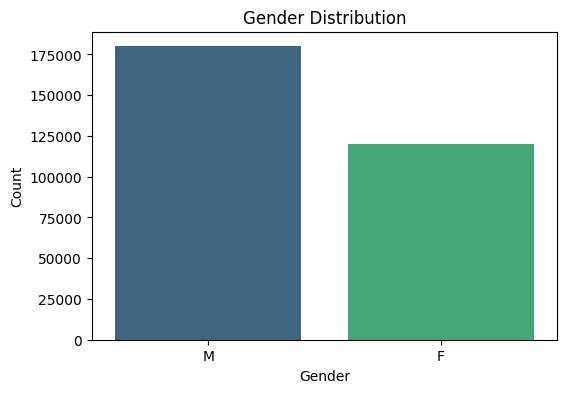

In [14]:
#Gender Distribution

gender_counts = df['sex'].value_counts()
plt.figure(figsize=(6, 4))
sns.barplot(x=gender_counts.index, y=gender_counts.values, palette="viridis")
plt.title("Gender Distribution")
plt.xlabel("Gender")
plt.ylabel("Count")
plt.show(block=True)

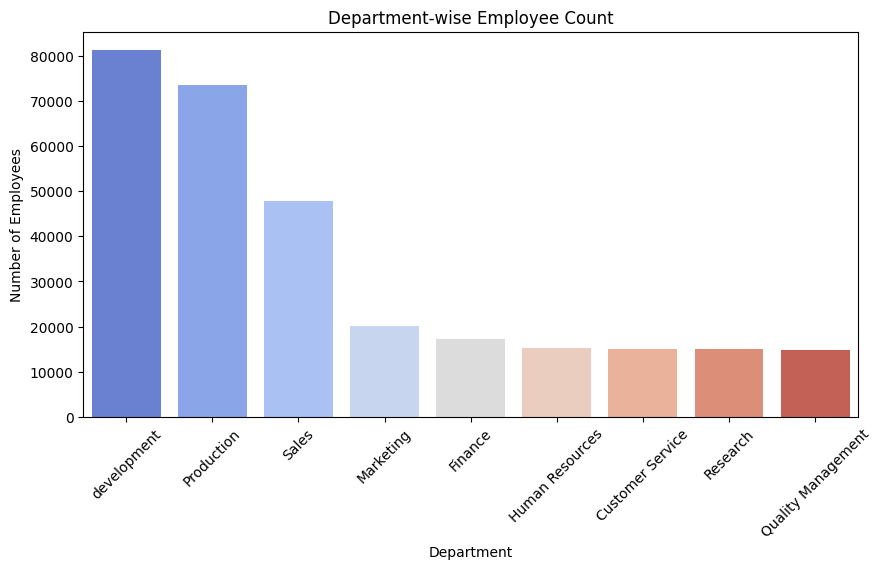

In [15]:
#Department-wise Employee Count

dept_counts = df['primary_dept_name'].value_counts()
plt.figure(figsize=(10, 5))
sns.barplot(x=dept_counts.index, y=dept_counts.values, palette="coolwarm")
plt.xticks(rotation=45)
plt.title("Department-wise Employee Count")
plt.xlabel("Department")
plt.ylabel("Number of Employees")
plt.show()


In [16]:
#Distinct Roles

roles = df['title'].nunique()
print(f"Total Distinct Roles: {roles}")
print(df['title'].unique())

Total Distinct Roles: 7
['Senior Engineer' 'Staff' 'Assistant Engineer' 'Engineer' 'Senior Staff'
 'Technique Leader' 'Manager']


### Employee Retention & Attrition

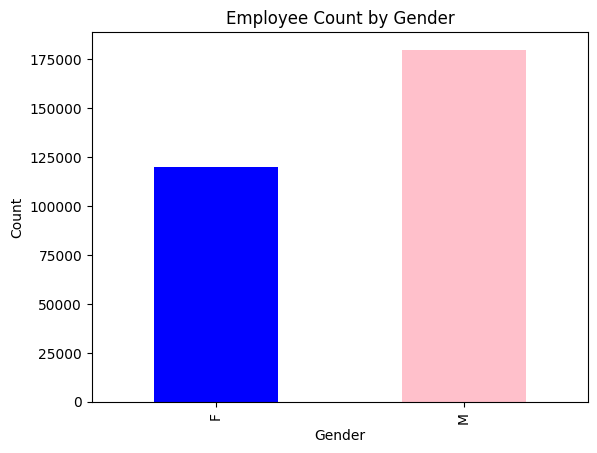

In [17]:
#Employees Distribution by Gender

gender_retention = df.groupby('sex')['emp_no'].nunique()
gender_retention.plot(kind='bar', color=['blue', 'pink'])
plt.title("Employee Count by Gender")
plt.xlabel("Gender")
plt.ylabel("Count")
plt.show()


# FEMALE: 1,20,051 | MALE: 1,79,973

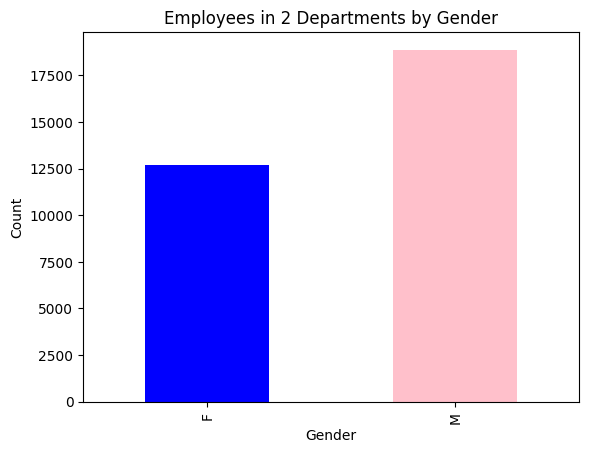

In [18]:
#Employees Who Worked in 2 Departments by Gender

multi_dept = df[df['other_dept_name'].notnull() & (df['other_dept_name'] != 'None')]
multi_dept_gender = multi_dept.groupby('sex')['emp_no'].nunique()
multi_dept_gender.plot(kind='bar', color=['blue', 'pink'])
plt.title("Employees in 2 Departments by Gender")
plt.xlabel("Gender")
plt.ylabel("Count")
plt.show()

# F: 12,310 | M: 18,877

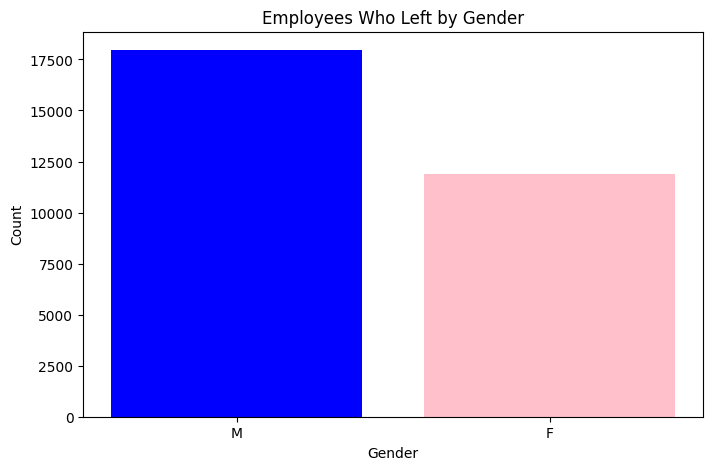

In [19]:
# Filter employees who left (last_date is not null)
left_by_gender = df[df['last_date'].notnull()]

# Count unique employees who left by gender
left_by_gender = left_by_gender.groupby('sex')['emp_no'].nunique().reset_index()
left_by_gender.columns = ['Gender', 'Employees Left Count']

# Sort by gender (optional, to match SQL order)
left_by_gender = left_by_gender.sort_values(by='Gender', ascending=False)

# Plot bar chart
plt.figure(figsize=(8, 5))
plt.bar(left_by_gender['Gender'], left_by_gender['Employees Left Count'], color=['blue', 'pink'])
plt.title("Employees Who Left by Gender")
plt.xlabel("Gender")
plt.ylabel("Count")

# Show the plot
plt.show()

# F: 11,907 | M: 17,960

In [20]:
#Total Employees Left

total_left = df['last_date'].notnull().sum()
print(f"Total Employees Left: {total_left}")


Total Employees Left: 29867


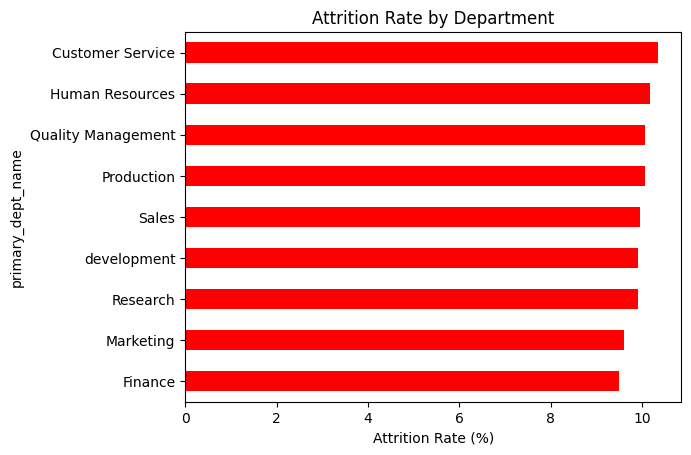

In [21]:
#Attrition Rate by Department

df['left'] = df['last_date'].notnull().astype(int)
attrition_rate = df.groupby('primary_dept_name')['left'].mean() * 100
attrition_rate.sort_values().plot(kind='barh', color='red')
plt.title("Attrition Rate by Department")
plt.xlabel("Attrition Rate (%)")
plt.show()


# primary_dept_name	      attrition_rate
#Customer Service	        10.34
#Human Resources		        10.18
#Quality Management	        10.07
#Production 	                10.06
#Sales	                     9.96
#development	                 9.92
#Research	                 9.91
#Marketing	                 9.60
#Finance	                     9.49


###  Salary & Compensation Analysis

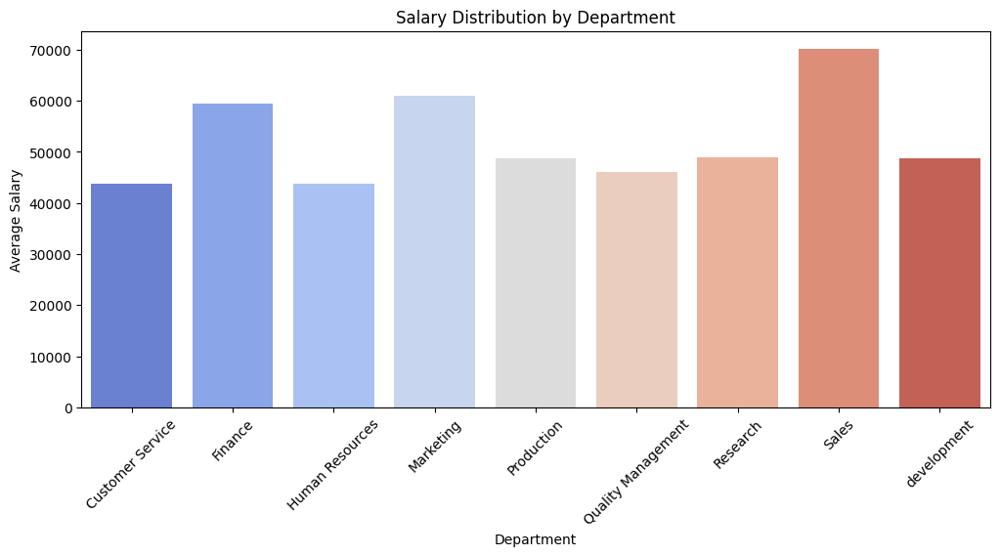

In [22]:
#Average Salary per Department

dept_salary = df.groupby('primary_dept_name')['salary'].mean().reset_index()

plt.figure(figsize=(12, 5))
sns.barplot(x='primary_dept_name', y='salary', data=dept_salary, palette='coolwarm')
plt.xticks(rotation=45)
plt.xlabel("Department")
plt.ylabel("Average Salary")
plt.title("Salary Distribution by Department")
plt.show()


# primary_dept_name	avg_salary
#Sales	              70171
#Marketing	          61095.9
#Finance	          59533.52
#Research	          48910.71
#Production           48760.45
#development	      48680.8
#Quality Management	  45984.07
#Human Resources	  43859.71
#Customer Service	  43745.44


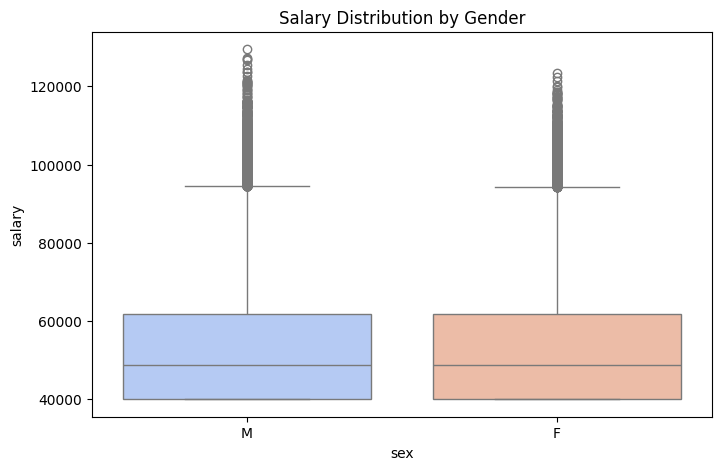

In [23]:
#Salary Distribution by Gender

plt.figure(figsize=(8, 5))
sns.boxplot(x="sex", y="salary", data=df, palette="coolwarm")
plt.title("Salary Distribution by Gender")
plt.show()


#sex	avg_salary
#F	     52953.84
#M	     52982

In [24]:
#Top 5 Highest-Paid Employees

top_paid = df[['emp_no', 'first_name', 'last_name', 'title', 'primary_dept_name', 'other_dept_name', 'salary']]\
    .sort_values(by='salary', ascending=False)\
    .head(5)\
    .reset_index(drop=True)  # Drop old index for cleaner output

# Display result
top_paid


,emp_no,first_name,last_name,title,primary_dept_name,other_dept_name,salary
0,205000,Charmane,Griswold,Staff,Sales,None,129492
1,44188,Slavian,Peac,Senior Staff,Sales,None,127238
2,444756,Nahid,Varker,Staff,Sales,None,127041
3,458302,Poorav,Esposito,Staff,Sales,None,126703
4,37558,Juichirou,Thambidurai,Staff,Sales,None,125469


### Employee Performance Metrics

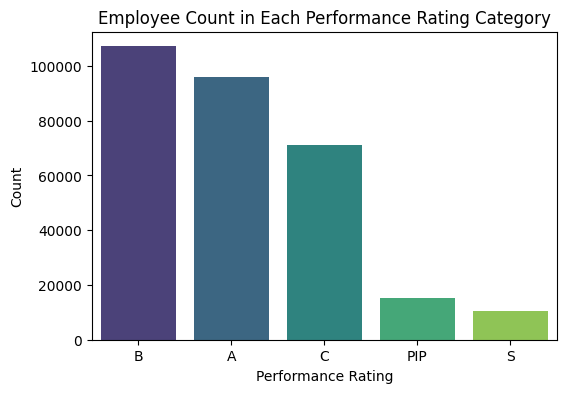

In [25]:
#Count of Employees in Each Rating Category

rating_counts = df['last_performance_rating'].value_counts()

plt.figure(figsize=(6, 4))
sns.barplot(x=rating_counts.index, y=rating_counts.values, palette="viridis")
plt.title("Employee Count in Each Performance Rating Category")
plt.xlabel("Performance Rating")
plt.ylabel("Count")
plt.show()

# Last_performance_rating	employee_count
#B	                          107154
#A	                           95919
#C	                           71304
#PIP	                       15105
#S	                           10542

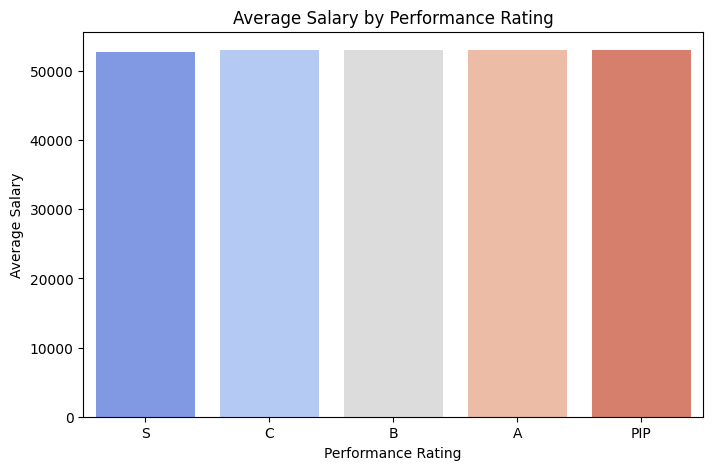

In [26]:
#Average Salary per Performance Rating

avg_salary_rating = df.groupby('last_performance_rating')['salary'].mean().sort_values()

plt.figure(figsize=(8, 5))
sns.barplot(x=avg_salary_rating.index, y=avg_salary_rating.values, palette="coolwarm")
plt.title("Average Salary by Performance Rating")
plt.xlabel("Performance Rating")
plt.ylabel("Average Salary")
plt.show()


#Last_performance_rating	avg_salary
#PIP	                      53013.57
#A	                          52995.87
#B	                          52965.29
#C	                          52962.36
#S	                          52792.56

In [27]:
#Employees in PIP (Performance Improvement Plan)

pip_count = df[df['last_performance_rating'] == 'PIP']['emp_no'].nunique()
print(f"Total Employees in PIP: {pip_count}")


Total Employees in PIP: 15105


In [28]:
#Top Performers (A Rating) by Salary

top_performers = df[df['last_performance_rating'] == 'A'][['emp_no', 'first_name', 'last_name', 'salary']].sort_values(by='salary', ascending=False).head(10).reset_index()
top_performers


,index,emp_no,first_name,last_name,salary
0,34187,44188,Slavian,Peac,127238
1,244780,444756,Nahid,Varker,127041
2,196881,296857,Toshimo,Reghbati,124357
3,167029,267005,Filipe,Condotta,122423
4,138141,238117,Mitsuyuki,Stanfel,121617
5,206771,406747,Huiqun,Birke,121393
6,158801,258777,Manibrata,Lieberherr,121070
7,18300,28301,Adil,Brickell,120446
8,212188,412164,Slavian,Merro,119939
9,137698,237674,Chaitali,Baik,119370


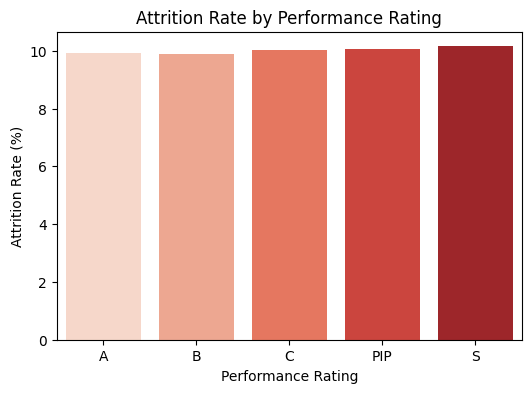

In [29]:
#Attrition Rate by Performance Rating

df['left'] = df['last_date'].notnull().astype(int)
attrition_rating = df.groupby('last_performance_rating')['left'].mean() * 100

plt.figure(figsize=(6, 4))
sns.barplot(x=attrition_rating.index, y=attrition_rating.values, palette="Reds")
plt.title("Attrition Rate by Performance Rating")
plt.xlabel("Performance Rating")
plt.ylabel("Attrition Rate (%)")
plt.show()


#Last_performance_rating		attrition_rate
#S	 	                           10.15
#PIP		                       10.04
#C		                           10.02
#A		                            9.94
#B	                        	    9.90

In [30]:
#Max & Average Number of Projects by Rating

proj_stats = df.groupby('last_performance_rating')['no_of_projects'].agg(['max', 'mean']).round(2)
print(proj_stats)


                         max  mean
last_performance_rating           
A                         10  5.52
B                         10  5.49
C                         10  5.51
PIP                       10  5.51
S                         10  5.52


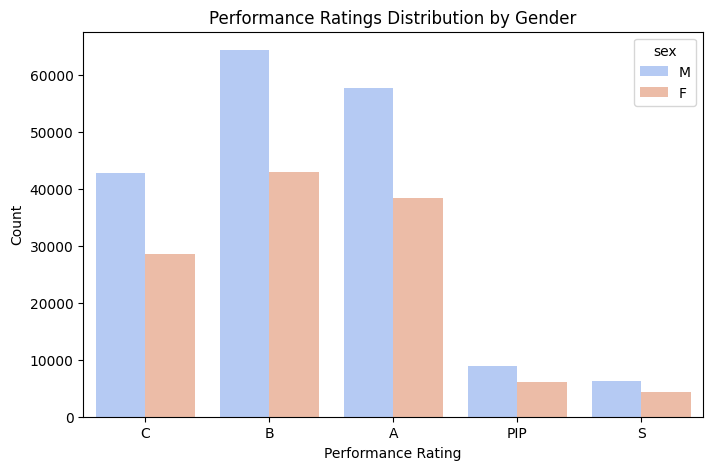

In [31]:
#Distribution of Performance Ratings by Gender

plt.figure(figsize=(8, 5))
sns.countplot(x="last_performance_rating", hue="sex", data=df, palette="coolwarm")
plt.title("Performance Ratings Distribution by Gender")
plt.xlabel("Performance Rating")
plt.ylabel("Count")
plt.show()


#sex	Last_performance_rating	    count

#F	            B	                42864
#F	            A	                38294
#F	            C	                28509
#F	           PIP	                 6126
#F	            S	                 4258

#M	            B	                64290
#M	            A               	57625
#M	            C               	42795
#M	           PIP	                 8979
#M	            S	                 6284

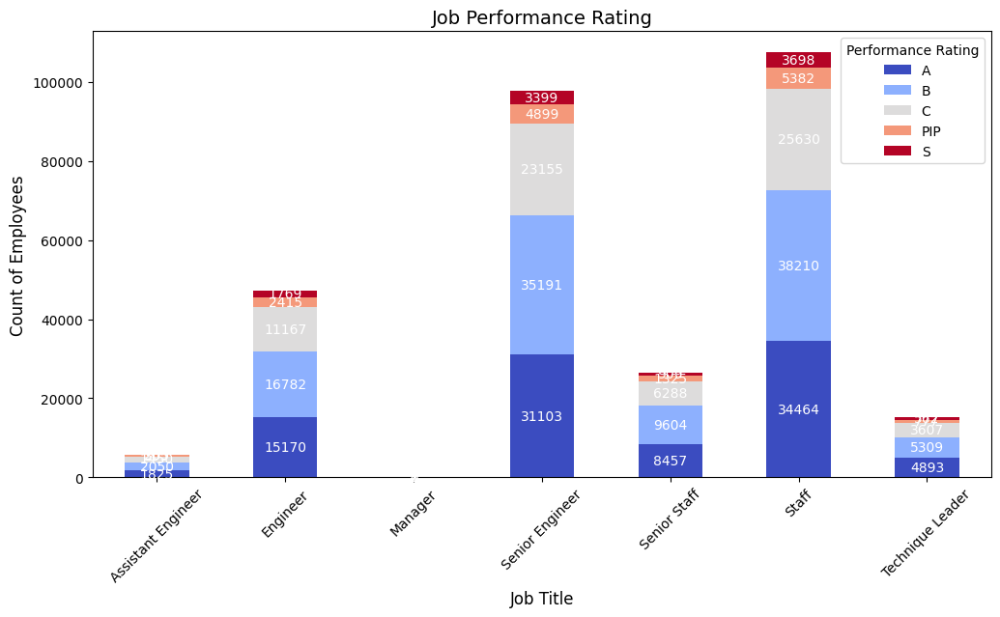

last_performance_rating,A,B,C,PIP,S
title,,,,,
Assistant Engineer,1825,2050,1450,305,205
Engineer,15170,16782,11167,2415,1769
Manager,7,8,7,2,nan
Senior Engineer,31103,35191,23155,4899,3399
Senior Staff,8457,9604,6288,1325,909
Staff,34464,38210,25630,5382,3698
Technique Leader,4893,5309,3607,777,562
Total,95919,107154,71304,15105,10542


In [32]:
#Job Performance Rating

# Group data
promotions = df.groupby(['title', 'last_performance_rating'])['emp_no'].count().unstack()

# Create figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Plot stacked bar chart
promotions.plot(kind='bar', stacked=True, colormap='coolwarm', ax=ax)

# Title and labels
plt.title("Job Performance Rating", fontsize=14)
plt.xlabel("Job Title", fontsize=12)
plt.ylabel("Count of Employees", fontsize=12)
plt.xticks(rotation=45, fontsize=10)

# Add numbers on the bars
for bar_container in ax.containers:
    ax.bar_label(bar_container, fmt='%d', label_type='center', fontsize=10, color='white')

# Add a table with numeric values below the plot
table_data = promotions.copy()
table_data.loc['Total'] = table_data.sum()  # Add a total row
table_display = table_data.style.format("{:.0f}")  # Format to remove decimals

# Show legend
plt.legend(title="Performance Rating")

# Display the DataFrame with counts
plt.show()
display(table_display)


,Department,Avg Tenure (Years),Max Tenure (Years),Min Tenure (Years)
0,Customer Service,7.52,13.70,1.37
1,Finance,7.41,13.70,1.38
2,Human Resources,7.57,13.70,1.38
3,Marketing,7.43,13.69,1.37
4,Production,7.58,13.70,1.37
5,Quality Management,7.57,13.68,1.38
6,Research,7.63,13.69,1.38
7,Sales,7.51,13.70,1.37
8,development,7.51,13.70,1.37


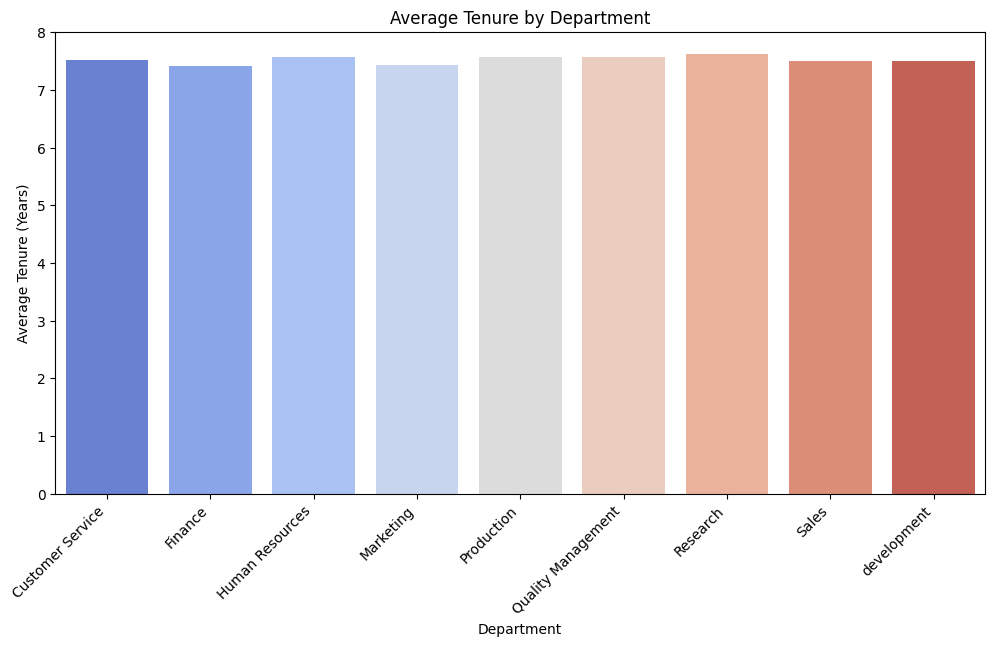

In [33]:
#Average Tenure by Department

# Ensure 'hire_date' and 'last_date' are datetime
df['hire_date'] = pd.to_datetime(df['hire_date'])
df['last_date'] = pd.to_datetime(df['last_date'])

# Exclude employees who are still working
df_filtered = df[df['last_date'].notna()]

# Group by department and compute tenure stats directly
tenure_stats = df_filtered.groupby('primary_dept_name').agg(
    Avg_Tenure_Years=('hire_date', lambda x: round(((df_filtered.loc[x.index, 'last_date'] - x).dt.days / 365).mean(), 2)),
    Max_Tenure_Years=('hire_date', lambda x: round(((df_filtered.loc[x.index, 'last_date'] - x).dt.days / 365).max(), 2)),
    Min_Tenure_Years=('hire_date', lambda x: round(((df_filtered.loc[x.index, 'last_date'] - x).dt.days / 365).min(), 2))
).reset_index()

# Rename columns
tenure_stats.columns = ['Department', 'Avg Tenure (Years)', 'Max Tenure (Years)', 'Min Tenure (Years)']

# Display result
display(tenure_stats)

# ------------------------- VISUALIZATION -------------------------

# Set figure size
plt.figure(figsize=(12, 6))

# Plot bar chart
sns.barplot(x='Department', y='Avg Tenure (Years)', data=tenure_stats, palette='coolwarm')

# Rotate x-axis labels for readability
plt.xticks(rotation=45, ha='right')

# Labels and title
plt.xlabel('Department')
plt.ylabel('Average Tenure (Years)')
plt.title('Average Tenure by Department')

# Show plot
plt.show()


### Extra Analysis

In [34]:
#Employee Details with Salary

df[['emp_no', 'last_name', 'first_name', 'sex', 'salary']]

,emp_no,last_name,first_name,sex,salary
0,10001,Facello,Georgi,M,60117
1,10002,Simmel,Bezalel,F,65828
2,10003,Bamford,Parto,M,40006
3,10004,Koblick,Chirstian,M,40054
4,10005,Maliniak,Kyoichi,M,78228
...,...,...,...,...,...
300019,499995,Lichtner,Dekang,F,40000
300020,499996,Baaz,Zito,M,58058
300021,499997,Lenart,Berhard,M,49597
300022,499998,Breugel,Patricia,M,40000


In [35]:
# Employees Hired in 1986

df[df['hire_date'].dt.year == 1986][['first_name', 'last_name', 'hire_date']]

,first_name,last_name,hire_date
0,Georgi,Facello,1986-06-26
2,Parto,Bamford,1986-08-28
3,Chirstian,Koblick,1986-12-01
52,Sanjiv,Zschoche,1986-02-04
65,Kwee,Schusler,1986-02-26
...,...,...,...
299964,Yolla,Auria,1986-04-25
299970,Barton,Soicher,1986-02-21
300006,Mohammed,Pleszkun,1986-02-21
300012,Bangqing,Kleiser,1986-06-06


In [36]:
# Managers of Each Department

df_managers = df[df['title'].str.contains("Manager", na=False)].reset_index()
df_managers[['primary_dept_no', 'primary_dept_name', 'emp_no', 'last_name', 'first_name']]


,primary_dept_no,primary_dept_name,emp_no,last_name,first_name
0,d001,Marketing,110022,Markovitch,Margareta
1,d001,Marketing,110039,Minakawa,Vishwani
2,d002,Finance,110085,Alpin,Ebru
3,d002,Finance,110114,Legleitner,Isamu
4,d003,Human Resources,110183,Ossenbruggen,Shirish
5,d003,Human Resources,110228,Sigstam,Karsten
6,d004,Production,110303,Wegerle,Krassimir
7,d004,Production,110344,Cools,Rosine
8,d004,Production,110386,Kieras,Shem
9,d004,Production,110420,Ghazalie,Oscar


In [37]:
# Department of Each Employee

df[['emp_no', 'last_name', 'first_name', 'primary_dept_name','other_dept_name']]


,emp_no,last_name,first_name,primary_dept_name,other_dept_name
0,10001,Facello,Georgi,development,None
1,10002,Simmel,Bezalel,Sales,None
2,10003,Bamford,Parto,Production,None
3,10004,Koblick,Chirstian,Production,None
4,10005,Maliniak,Kyoichi,Human Resources,None
...,...,...,...,...,...
300019,499995,Lichtner,Dekang,Production,None
300020,499996,Baaz,Zito,Production,None
300021,499997,Lenart,Berhard,development,None
300022,499998,Breugel,Patricia,Finance,None


In [38]:
# Employees Named "Hercules B"

df[(df['first_name'] == 'Hercules') & (df['last_name'].str.startswith('B'))][['first_name', 'last_name', 'sex']].reset_index()


,index,first_name,last_name,sex
0,281,Hercules,Benzmuller,M
1,1336,Hercules,Brendel,F
2,10779,Hercules,Baranowski,M
3,11869,Hercules,Barreiro,M
4,28160,Hercules,Baer,M
5,79381,Hercules,Bernardinello,F
6,79843,Hercules,Basagni,M
7,80711,Hercules,Biran,F
8,110121,Hercules,Bernatsky,M
9,113577,Hercules,Bail,F


In [39]:
# Employees in Sales or Development Departments

df_sales_dev = df[
    (df['primary_dept_name'].isin(['Sales', 'development'])) | 
    (df['other_dept_name'].isin(['Sales', 'development']))
][['emp_no', 'last_name', 'first_name', 'primary_dept_name', 'other_dept_name']]

# Display the result
df_sales_dev


,emp_no,last_name,first_name,primary_dept_name,other_dept_name
0,10001,Facello,Georgi,development,None
1,10002,Simmel,Bezalel,Sales,None
5,10006,Preusig,Anneke,development,None
7,10008,Kalloufi,Saniya,development,None
11,10012,Bridgland,Patricio,development,None
...,...,...,...,...,...
300010,499986,Ranta,Nathan,Sales,None
300011,499987,Dusink,Rimli,Sales,None
300012,499988,Kleiser,Bangqing,Sales,None
300014,499990,Kohling,Khaled,development,None


In [40]:
#Frequency of Employee Last Names

last_name_counts = df['last_name'].value_counts().reset_index()
last_name_counts.columns = ['last_name', 'frequency']
last_name_counts


,last_name,frequency
0,Baba,226
1,Gelosh,223
2,Coorg,223
3,Sudbeck,222
4,Farris,222
...,...,...
1633,Zykh,148
1634,Guardalben,148
1635,Merro,147
1636,Sadowsky,145


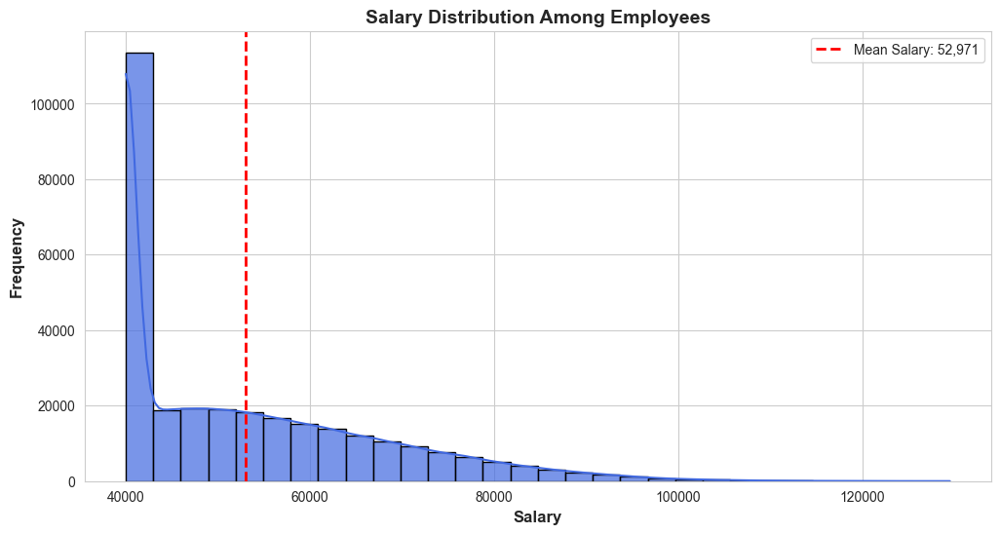

In [41]:
#Salary Distribution

# Set a modern style
sns.set_style("whitegrid")

# Create the figure and axis
plt.figure(figsize=(12, 6))

# Histogram with Kernel Density Estimation (KDE) for smooth curve
sns.histplot(df['salary'], bins=30, kde=True, color='royalblue', edgecolor='black', alpha=0.7)

# Improve labels and title
plt.xlabel("Salary", fontsize=12, fontweight='bold')
plt.ylabel("Frequency", fontsize=12, fontweight='bold')
plt.title("Salary Distribution Among Employees", fontsize=14, fontweight='bold')

# Add a mean salary line for better interpretation
mean_salary = df['salary'].mean()
plt.axvline(mean_salary, color='red', linestyle='dashed', linewidth=2, label=f'Mean Salary: {mean_salary:,.0f}')

# Display legend
plt.legend()

# Show the plot
plt.show()


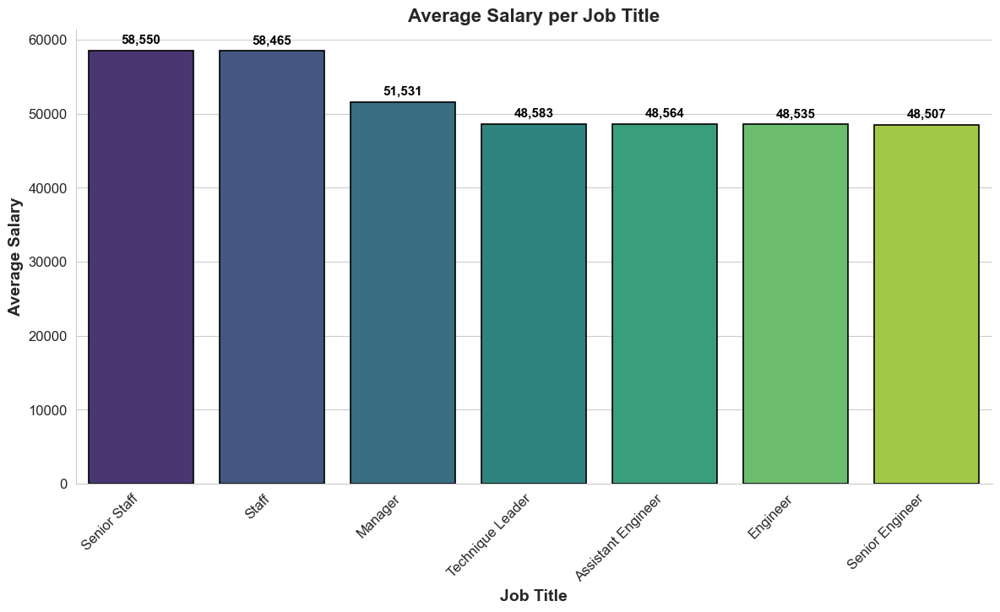

In [42]:
#Average Salary per Title

# Calculate average salary per job title and sort
avg_salary_title = df.groupby('title')['salary'].mean().reset_index()
avg_salary_title = avg_salary_title.sort_values(by='salary', ascending=False)

# Set Seaborn style
sns.set_style("whitegrid")

# Create the figure and axis
plt.figure(figsize=(14, 7))

# Create bar plot with improved styling
sns.barplot(
    x='title', 
    y='salary', 
    data=avg_salary_title, 
    palette='viridis',  # Alternative to 'coolwarm' for a fresh look
    edgecolor='black',
    linewidth=1.2
)

# Improve readability
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel("Job Title", fontsize=14, fontweight='bold')
plt.ylabel("Average Salary", fontsize=14, fontweight='bold')
plt.title("Average Salary per Job Title", fontsize=16, fontweight='bold')

# Show values on top of bars for better understanding
for index, value in enumerate(avg_salary_title['salary']):
    plt.text(index, value + 1000, f"{value:,.0f}", ha='center', fontsize=11, fontweight='bold', color='black')

# Remove top and right spines for a cleaner look
sns.despine()

# Show the plot
plt.show()


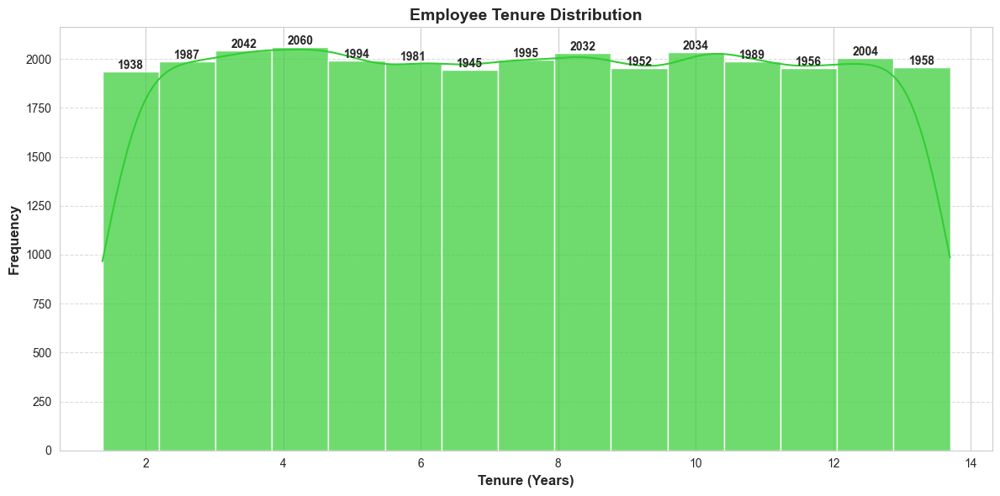

In [7]:
#Tenure distribution

# Ensure 'last_date' and 'hire_date' are in datetime format
df['hire_date'] = pd.to_datetime(df['hire_date'], errors='coerce')
df['last_date'] = pd.to_datetime(df['last_date'], errors='coerce')

# Filter out rows where 'last_date' is missing (employees still working)
df_exit = df[df['last_date'].notna()]

# Calculate tenure in years directly within the plot
plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")

# Create the histogram with KDE
sns.histplot((df_exit['last_date'] - df_exit['hire_date']).dt.days / 365, bins=15, kde=True, color='limegreen', alpha=0.7)

# Adding labels and title
plt.xlabel("Tenure (Years)", fontsize=12, fontweight='bold')
plt.ylabel("Frequency", fontsize=12, fontweight='bold')
plt.title("Employee Tenure Distribution", fontsize=14, fontweight='bold')

# Adding numbers on top of the bars
for p in plt.gca().patches:
    height = p.get_height()
    width = p.get_width()
    x = p.get_x() + width / 2
    y = p.get_y() + height
    plt.text(x, y, str(int(height)), ha='center', va='bottom', fontsize=10, fontweight='bold')

# Show gridlines for easier reading
plt.grid(True, axis='y', linestyle='--', alpha=0.7)

# Tight layout for clarity
plt.tight_layout()

# Show the plot
plt.show()


 Age Distribution of Employees Hired (1980s - 1995)
age_at_hiring
20     1420
21     4374
22     7024
23     9254
24    11625
25    13957
26    15425
27    17344
28    18802
29    19993
30    20849
31    21541
32    21257
33    20305
34    17026
35    14544
36    11875
37     9755
38     7501
39     5635
40     4088
41     2687
42     1453
43      365
Name: count, dtype: int64

 Mean Age at Hiring: 30.44 years


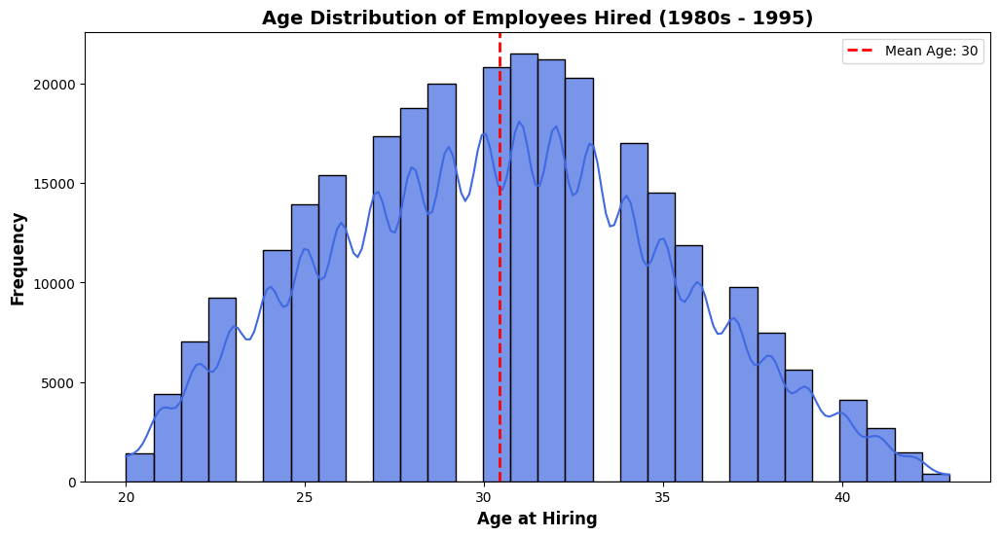

In [10]:
# Age Distribution of Employees 

# Ensure 'hire_date' and 'birth_date' are in datetime format
df['hire_date'] = pd.to_datetime(df['hire_date'], errors='coerce')
df['birth_date'] = pd.to_datetime(df['birth_date'], errors='coerce')

# Filter employees hired between 1980 and 1995
df_hired_80s_95 = df[(df['hire_date'].dt.year >= 1980) & (df['hire_date'].dt.year <= 1995)]

# Calculate age at the time of hiring
df_hired_80s_95['age_at_hiring'] = (df_hired_80s_95['hire_date'] - df_hired_80s_95['birth_date']).dt.days // 365

#  Print Summary Statistics
age_counts = df_hired_80s_95['age_at_hiring'].value_counts().sort_index()
mean_age = df_hired_80s_95['age_at_hiring'].mean()

print(" Age Distribution of Employees Hired (1980s - 1995)")
print(age_counts)
print(f"\n Mean Age at Hiring: {mean_age:.2f} years")

#  Plot Age Distribution
plt.figure(figsize=(12, 6))
sns.histplot(df_hired_80s_95['age_at_hiring'], bins=30, kde=True, color='royalblue', edgecolor='black', alpha=0.7)

# Improve readability
plt.xlabel("Age at Hiring", fontsize=12, fontweight='bold')
plt.ylabel("Frequency", fontsize=12, fontweight='bold')
plt.title("Age Distribution of Employees Hired (1980s - 1995)", fontsize=14, fontweight='bold')

# Show mean age line
plt.axvline(mean_age, color='red', linestyle='dashed', linewidth=2, label=f'Mean Age: {mean_age:.0f}')

# Display legend
plt.legend()

# Show plot
plt.show()


 Age Distribution of Employees (All Hires)
age_at_hiring
20     1420
21     4374
22     7024
23     9254
24    11625
25    13957
26    15425
27    17344
28    18802
29    19993
30    20849
31    21978
32    22289
33    21717
34    18666
35    16225
36    13545
37    11422
38     9185
39     7372
40     5813
41     4368
42     3087
43     2074
44     1275
45      651
46      250
47       40
Name: count, dtype: int64

 Mean Age at Hiring: 31.02 years


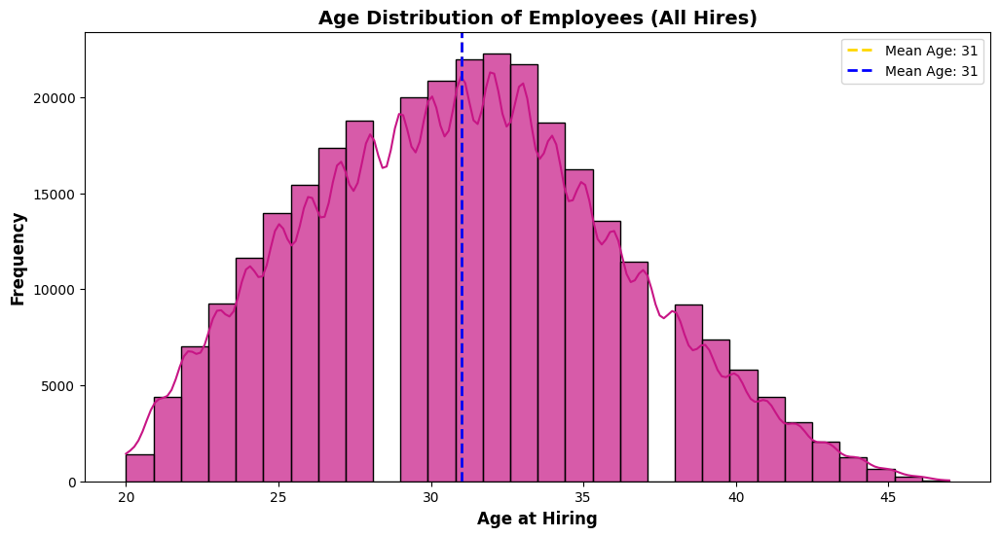

In [16]:
#Age Distribution of Employees (All Hires)

# Ensure 'hire_date' and 'birth_date' are in datetime format
df['hire_date'] = pd.to_datetime(df['hire_date'], errors='coerce')
df['birth_date'] = pd.to_datetime(df['birth_date'], errors='coerce')

# Calculate age at the time of hiring for all employees
df['age_at_hiring'] = (df['hire_date'] - df['birth_date']).dt.days // 365

# Print Summary Statistics
age_counts = df['age_at_hiring'].value_counts().sort_index()
mean_age = df['age_at_hiring'].mean()

print(" Age Distribution of Employees (All Hires)")
print(age_counts)
print(f"\n Mean Age at Hiring: {mean_age:.2f} years")

# Plot Age Distribution
plt.figure(figsize=(12, 6))
sns.histplot(df['age_at_hiring'], bins=30, kde=True, color='mediumvioletred', edgecolor='black', alpha=0.7)
plt.axvline(mean_age, color='gold', linestyle='dashed', linewidth=2, label=f'Mean Age: {mean_age:.0f}')

# Improve readability
plt.xlabel("Age at Hiring", fontsize=12, fontweight='bold')
plt.ylabel("Frequency", fontsize=12, fontweight='bold')
plt.title("Age Distribution of Employees (All Hires)", fontsize=14, fontweight='bold')

# Show mean age line
plt.axvline(mean_age, color='blue', linestyle='dashed', linewidth=2, label=f'Mean Age: {mean_age:.0f}')

# Display legend
plt.legend()

# Show plot
plt.show()


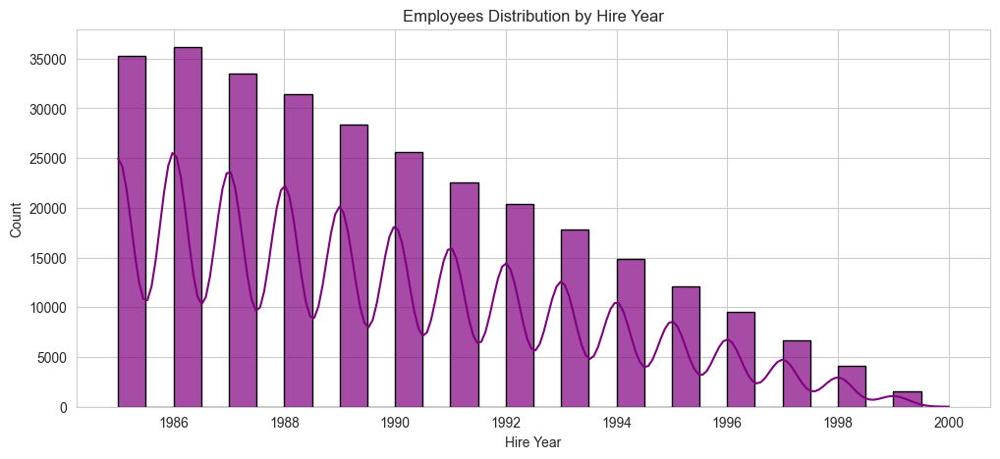

hire_date
1985    35316
1986    36150
1987    33501
1988    31436
1989    28394
1990    25610
1991    22568
1992    20402
1993    17772
1994    14835
1995    12115
1996     9574
1997     6669
1998     4155
1999     1514
2000       13
Name: count, dtype: int64


In [45]:
# Ensure 'hire_date' is in datetime format
df['hire_date'] = pd.to_datetime(df['hire_date'], errors='coerce')

# Extract hire years directly for plotting
plt.figure(figsize=(12, 5))
sns.histplot(df['hire_date'].dt.year, bins=30, kde=True, color='purple', edgecolor='black', alpha=0.7)

# Add labels and title
plt.xlabel("Hire Year")
plt.ylabel("Count")
plt.title("Employees Distribution by Hire Year")

# Show the plot
plt.show()

# Display the count of employees per hire year without creating a new column
hire_year_counts = df['hire_date'].dt.year.value_counts().sort_index()
print(hire_year_counts)


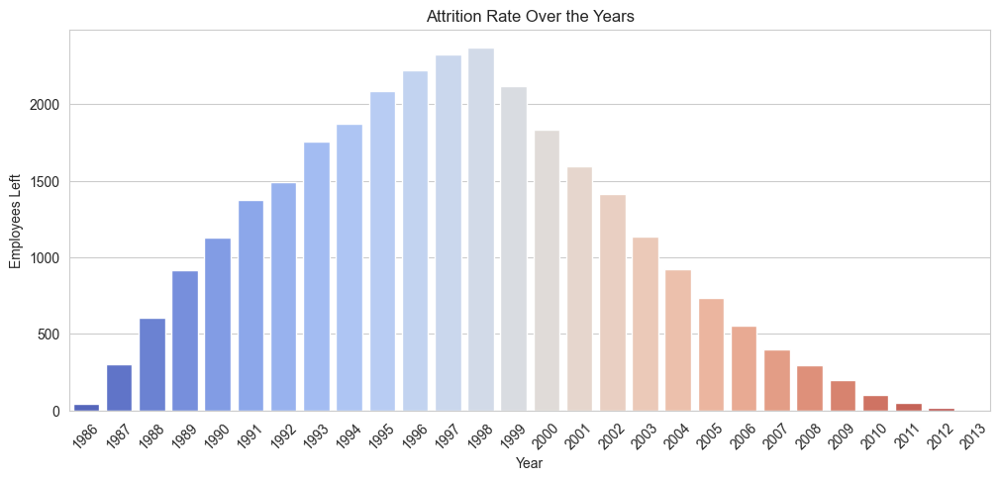

exit_year
1986      42
1987     305
1988     605
1989     916
1990    1131
1991    1375
1992    1494
1993    1759
1994    1870
1995    2085
1996    2220
1997    2326
1998    2368
1999    2119
2000    1831
2001    1593
2002    1413
2003    1133
2004     921
2005     738
2006     552
2007     403
2008     295
2009     202
2010     104
2011      49
2012      17
2013       1
Name: count, dtype: int64


In [46]:
# Attrition Rate Over the Years

# Ensure 'last_date' is in datetime format
df['last_date'] = pd.to_datetime(df['last_date'], errors='coerce')

# Filter employees who have exited
df_exit = df[df['last_date'].notna()]

# Extract the exit year
df_exit['exit_year'] = df_exit['last_date'].dt.year

# Plot the count of employees who left each year
plt.figure(figsize=(12, 5))
sns.countplot(x=df_exit['exit_year'], palette='coolwarm')
plt.xlabel("Year")
plt.ylabel("Employees Left")
plt.title("Attrition Rate Over the Years")
plt.xticks(rotation=45)
plt.show()

# Show the numerical summary (number of employees who left per year)
exit_year_counts = df_exit['exit_year'].value_counts().sort_index()
print(exit_year_counts)


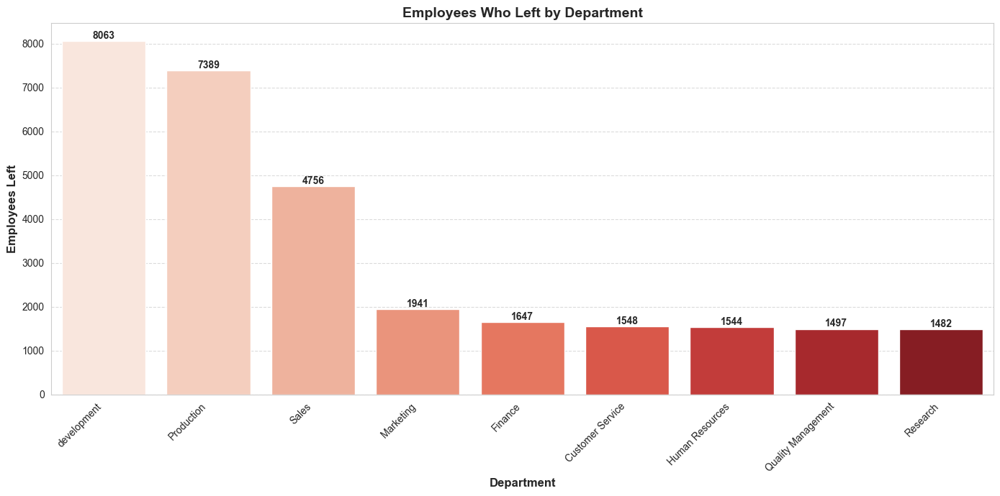

In [47]:
# Employees Who Left by Department

# Grouping the data by department where 'left' is 1 (meaning the employee has left)
df_exit_dept = df[df['left'] == 1].groupby('primary_dept_name').size().reset_index(name='left_count')

# Sort the data by 'left_count' in descending order
df_exit_dept = df_exit_dept.sort_values(by='left_count', ascending=False)

# Set the figure size for better clarity
plt.figure(figsize=(14, 7))

# Create a bar plot
sns.barplot(x='primary_dept_name', y='left_count', data=df_exit_dept, palette='Reds')

# Rotate the x-axis labels for better visibility
plt.xticks(rotation=45, ha='right')

# Adding labels and title
plt.xlabel("Department", fontsize=12, fontweight='bold')
plt.ylabel("Employees Left", fontsize=12, fontweight='bold')
plt.title("Employees Who Left by Department", fontsize=14, fontweight='bold')

# Adding the count values on top of each bar
for index, value in enumerate(df_exit_dept['left_count']):
    plt.text(index, value + 0.5, str(value), ha='center', va='bottom', fontsize=10, fontweight='bold')

# Show grid for easier reading of values
plt.grid(True, axis='y', linestyle='--', alpha=0.7)

# Tight layout to avoid clipping
plt.tight_layout()

# Show the plot
plt.show()


# Preparation for ML

### Read Data from SQL

In [3]:
# Made a duplicate of Final_table
query = "SELECT * FROM final_table"
df = pd.read_sql(query, conn)

# Convert Date Columns to DateTime
df['hire_date'] = pd.to_datetime(df['hire_date'])
df['last_date'] = pd.to_datetime(df['last_date'])
df['birth_date'] = pd.to_datetime(df['birth_date'])


### Data Preprocessing

##### Check for missing values

In [5]:
missing_values = df.isnull().sum()
print(missing_values[missing_values > 0])


last_date    270157
dtype: int64


In [6]:
# Calculate the latest hire_date in the dataset
latest_hire_date = df['hire_date'].max()

# Fill missing 'last_date' with the latest 'hire_date' 
df['last_date'] = df['last_date'].fillna(latest_hire_date)


In [7]:
# Checking the last_date

df['last_date'].isnull().sum() # no more nulls

np.int64(0)

#### creating a 'Tenure' column

In [8]:
# Calculate tenure (in years)

df['tenure'] = ((df['last_date'] - df['hire_date']).dt.days / 365).round(2)


In [9]:
df['tenure'] # check the column

0          8.10
1         14.19
2         13.43
3         13.17
4         10.38
          ...  
300019     7.05
300020     5.22
300021    13.78
300022     6.30
300023     2.16
Name: tenure, Length: 300024, dtype: float64

#### creating a 'Age' column

In [10]:
# Ensure birth_date and hire_date are in datetime format
df['birth_date'] = pd.to_datetime(df['birth_date'], errors='coerce')
df['hire_date'] = pd.to_datetime(df['hire_date'], errors='coerce')

# Calculate age at the time of hiring
df['age'] = df['hire_date'].dt.year - df['birth_date'].dt.year


In [11]:
df

,emp_no,emp_title_id,birth_date,first_name,last_name,sex,hire_date,no_of_projects,last_performance_rating,left,last_date,salary,primary_dept_no,primary_dept_name,other_dept_no,other_dept_name,title_id,title,tenure,age
0,10001,e0003,1953-09-02,Georgi,Facello,M,1986-06-26,9,C,1,1994-07-30,60117,d005,Development,None,None,e0003,Senior Engineer,8.10,33
1,10002,s0001,1964-06-02,Bezalel,Simmel,F,1985-11-21,8,B,0,2000-01-28,65828,d007,Sales,None,None,s0001,Staff,14.19,21
2,10003,e0003,1959-12-03,Parto,Bamford,M,1986-08-28,1,C,0,2000-01-28,40006,d004,Production,None,None,e0003,Senior Engineer,13.43,27
3,10004,e0003,1954-05-01,Chirstian,Koblick,M,1986-12-01,5,A,0,2000-01-28,40054,d004,Production,None,None,e0003,Senior Engineer,13.17,32
4,10005,s0001,1955-01-21,Kyoichi,Maliniak,M,1989-09-12,6,A,0,2000-01-28,78228,d003,Human Resources,None,None,s0001,Staff,10.38,34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
300019,499995,e0002,1958-09-24,Dekang,Lichtner,F,1993-01-12,5,B,0,2000-01-28,40000,d004,Production,None,None,e0002,Engineer,7.05,35
300020,499996,e0003,1953-03-07,Zito,Baaz,M,1990-09-27,8,B,1,1995-12-15,58058,d004,Production,None,None,e0003,Senior Engineer,5.22,37
300021,499997,e0003,1961-08-03,Berhard,Lenart,M,1986-04-21,10,B,0,2000-01-28,49597,d005,Development,None,None,e0003,Senior Engineer,13.78,25
300022,499998,s0001,1956-09-05,Patricia,Breugel,M,1993-10-13,1,B,0,2000-01-28,40000,d002,Finance,None,None,s0001,Staff,6.30,37


### Define Target and Features

#### Define the Target Variable (left)

In [12]:
# Define target variable (dependent variable)
y = df['left']

In [12]:
y

0         1
1         0
2         0
3         0
4         0
         ..
300019    0
300020    1
300021    0
300022    0
300023    0
Name: left, Length: 300024, dtype: int64

In [13]:
df.dtypes

emp_no                              int64
emp_title_id                       object
birth_date                 datetime64[ns]
first_name                         object
last_name                          object
sex                                object
hire_date                  datetime64[ns]
no_of_projects                      int64
last_performance_rating            object
left                                int64
last_date                  datetime64[ns]
salary                              int64
primary_dept_no                    object
primary_dept_name                  object
other_dept_no                      object
other_dept_name                    object
title_id                           object
title                              object
tenure                            float64
age                                 int32
dtype: object

#### Select Features for X

##### Drop columns

- **`emp_no`**: Unique ID (doesn't help with prediction)
- **`first_name`, `last_name`**: Not useful for prediction
- **`hire_date`, `last_date`**: We will calculate tenure, so raw dates are not needed
- **`birth_date`**: Already calculated age, so raw dates are not needed
- **`primary_dept_no`, `other_dept_no`, `other_dept_name`**: Redundant if we keep `primary_dept_name`
- **`title_id`**: Title already exists, so it's redundant
- **`left`**:  Not used in feature

In [13]:
X = df.drop(columns=['emp_no', 'first_name', 'last_name', 'hire_date', 'last_date', 
                     'primary_dept_no', 'other_dept_no', 'other_dept_name', 'title_id', 'birth_date', 'left'])

In [34]:
X

,no_of_projects,last_performance_rating,salary,tenure,age,emp_title_id_e0002,emp_title_id_e0003,emp_title_id_e0004,emp_title_id_m0001,emp_title_id_s0001,...,primary_dept_name_Production,primary_dept_name_Quality Management,primary_dept_name_Research,primary_dept_name_Sales,title_Engineer,title_Manager,title_Senior Engineer,title_Senior Staff,title_Staff,title_Technique Leader
0,0.888889,2,0.224791,0.537135,0.481481,False,True,False,False,False,...,False,False,False,False,False,False,True,False,False,False
1,0.777778,3,0.288607,0.940981,0.037037,False,False,False,False,True,...,False,False,False,True,False,False,False,False,True,False
2,0.000000,2,0.000067,0.890584,0.259259,False,True,False,False,False,...,True,False,False,False,False,False,True,False,False,False
3,0.444444,4,0.000603,0.873342,0.444444,False,True,False,False,False,...,True,False,False,False,False,False,True,False,False,False
4,0.555556,4,0.427167,0.688329,0.518519,False,False,False,False,True,...,False,False,False,False,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
300019,0.444444,3,0.000000,0.467507,0.555556,True,False,False,False,False,...,True,False,False,False,True,False,False,False,False,False
300020,0.777778,3,0.201783,0.346154,0.629630,False,True,False,False,False,...,True,False,False,False,False,False,True,False,False,False
300021,1.000000,3,0.107239,0.913793,0.185185,False,True,False,False,False,...,False,False,False,False,False,False,True,False,False,False
300022,0.000000,3,0.000000,0.417772,0.629630,False,False,False,False,True,...,False,False,False,False,False,False,False,False,True,False


##### Label Encoder

In [14]:
from sklearn.preprocessing import LabelEncoder

#Convert performance ratings (Ordinal)
performance_order = {'PIP': 0, 'S': 1, 'C': 2, 'B': 3, 'A': 4}
X['last_performance_rating'] = X['last_performance_rating'].map(performance_order)


#### Convert Categorical Variables

In [15]:
X = pd.get_dummies(X, columns=['emp_title_id', 'sex', 'primary_dept_name', 'title'], drop_first=True)

In [13]:
X

,no_of_projects,last_performance_rating,salary,tenure,age,emp_title_id_e0002,emp_title_id_e0003,emp_title_id_e0004,emp_title_id_m0001,emp_title_id_s0001,...,primary_dept_name_Production,primary_dept_name_Quality Management,primary_dept_name_Research,primary_dept_name_Sales,title_Engineer,title_Manager,title_Senior Engineer,title_Senior Staff,title_Staff,title_Technique Leader
0,9,2,60117,8.10,33,False,True,False,False,False,...,False,False,False,False,False,False,True,False,False,False
1,8,3,65828,14.19,21,False,False,False,False,True,...,False,False,False,True,False,False,False,False,True,False
2,1,2,40006,13.43,27,False,True,False,False,False,...,True,False,False,False,False,False,True,False,False,False
3,5,4,40054,13.17,32,False,True,False,False,False,...,True,False,False,False,False,False,True,False,False,False
4,6,4,78228,10.38,34,False,False,False,False,True,...,False,False,False,False,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
300019,5,3,40000,7.05,35,True,False,False,False,False,...,True,False,False,False,True,False,False,False,False,False
300020,8,3,58058,5.22,37,False,True,False,False,False,...,True,False,False,False,False,False,True,False,False,False
300021,10,3,49597,13.78,25,False,True,False,False,False,...,False,False,False,False,False,False,True,False,False,False
300022,1,3,40000,6.30,37,False,False,False,False,True,...,False,False,False,False,False,False,False,False,True,False


In [19]:
print(X.dtypes)  # Should show only int and float types

no_of_projects                            int64
last_performance_rating                   int64
salary                                    int64
tenure                                  float64
age                                       int32
emp_title_id_e0002                         bool
emp_title_id_e0003                         bool
emp_title_id_e0004                         bool
emp_title_id_m0001                         bool
emp_title_id_s0001                         bool
emp_title_id_s0002                         bool
sex_M                                      bool
primary_dept_name_Development              bool
primary_dept_name_Finance                  bool
primary_dept_name_Human Resources          bool
primary_dept_name_Marketing                bool
primary_dept_name_Production               bool
primary_dept_name_Quality Management       bool
primary_dept_name_Research                 bool
primary_dept_name_Sales                    bool
title_Engineer                          

##### Feature Scaling

In [14]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X[['salary', 'no_of_projects', 'tenure', 'age']] = scaler.fit_transform(X[['salary', 'no_of_projects', 'tenure', 'age']])


In [17]:
X

,no_of_projects,last_performance_rating,salary,tenure,age,emp_title_id_e0002,emp_title_id_e0003,emp_title_id_e0004,emp_title_id_m0001,emp_title_id_s0001,...,primary_dept_name_Production,primary_dept_name_Quality Management,primary_dept_name_Research,primary_dept_name_Sales,title_Engineer,title_Manager,title_Senior Engineer,title_Senior Staff,title_Staff,title_Technique Leader
0,0.888889,2,0.224791,0.537135,0.481481,False,True,False,False,False,...,False,False,False,False,False,False,True,False,False,False
1,0.777778,3,0.288607,0.940981,0.037037,False,False,False,False,True,...,False,False,False,True,False,False,False,False,True,False
2,0.000000,2,0.000067,0.890584,0.259259,False,True,False,False,False,...,True,False,False,False,False,False,True,False,False,False
3,0.444444,4,0.000603,0.873342,0.444444,False,True,False,False,False,...,True,False,False,False,False,False,True,False,False,False
4,0.555556,4,0.427167,0.688329,0.518519,False,False,False,False,True,...,False,False,False,False,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
300019,0.444444,3,0.000000,0.467507,0.555556,True,False,False,False,False,...,True,False,False,False,True,False,False,False,False,False
300020,0.777778,3,0.201783,0.346154,0.629630,False,True,False,False,False,...,True,False,False,False,False,False,True,False,False,False
300021,1.000000,3,0.107239,0.913793,0.185185,False,True,False,False,False,...,False,False,False,False,False,False,True,False,False,False
300022,0.000000,3,0.000000,0.417772,0.629630,False,False,False,False,True,...,False,False,False,False,False,False,False,False,True,False


### Train Classification Models

##### Import Necessary Libraries

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, confusion_matrix, classification_report,  roc_curve

# Import Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier


Train-Test Split

In [35]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Print the shapes to verify
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

X_train shape: (240019, 26)
X_test shape: (60005, 26)
y_train shape: (240019,)
y_test shape: (60005,)


In [36]:
import joblib
import pandas as pd

# Assume X_train is already prepared and used for training
training_features = X_train.columns.tolist()

# Save the training feature names
joblib.dump(training_features, "training_features.pkl")

print("✅ Training feature names saved!")


✅ Training feature names saved!


In [18]:
training_features

['no_of_projects',
 'last_performance_rating',
 'salary',
 'tenure',
 'age',
 'emp_title_id_e0002',
 'emp_title_id_e0003',
 'emp_title_id_e0004',
 'emp_title_id_m0001',
 'emp_title_id_s0001',
 'emp_title_id_s0002',
 'sex_M',
 'primary_dept_name_Development',
 'primary_dept_name_Finance',
 'primary_dept_name_Human Resources',
 'primary_dept_name_Marketing',
 'primary_dept_name_Production',
 'primary_dept_name_Quality Management',
 'primary_dept_name_Research',
 'primary_dept_name_Sales',
 'title_Engineer',
 'title_Manager',
 'title_Senior Engineer',
 'title_Senior Staff',
 'title_Staff',
 'title_Technique Leader']

In [37]:
# Save datasets
joblib.dump(X_train, "X_train.pkl")
joblib.dump(X_test, "X_test.pkl")
joblib.dump(y_train, "y_train.pkl")
joblib.dump(y_test, "y_test.pkl")


['y_test.pkl']

 Define Models

In [27]:
# Define pipelines
models = {
    "Logistic Regression": Pipeline([
        ("scaler", StandardScaler()),  # Standardize for better performance
        ("classifier", LogisticRegression())
    ]),
    "Decision Tree": Pipeline([
        ("classifier", DecisionTreeClassifier())  # No need for scaling
    ]),
    "Random Forest": Pipeline([
        ("classifier", RandomForestClassifier())  # No need for scaling
    ]),
    "KNN": Pipeline([
        ("scaler", StandardScaler()),  # KNN needs scaling
        ("classifier", KNeighborsClassifier(n_jobs=1))
    ]),
    "XGBoost": Pipeline([
        ("classifier", XGBClassifier(use_label_encoder=False, eval_metric='logloss'))
    ]),
    "Gaussian Naive Bayes": Pipeline([
        ("classifier", GaussianNB())  # Naive Bayes doesn't need scaling
    ])
}

# Check pipeline structure
for name, model in models.items():
    print(f"{name}: {model}")


Logistic Regression: Pipeline(steps=[('scaler', StandardScaler()),
                ('classifier', LogisticRegression())])
Decision Tree: Pipeline(steps=[('classifier', DecisionTreeClassifier())])
Random Forest: Pipeline(steps=[('classifier', RandomForestClassifier())])
KNN: Pipeline(steps=[('scaler', StandardScaler()),
                ('classifier', KNeighborsClassifier(n_jobs=1))])
XGBoost: Pipeline(steps=[('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric='logloss',
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=Non

In [38]:
models = {
        "Logistic Regression": Pipeline([
        ("scaler", StandardScaler()), 
        ("classifier", LogisticRegression())
    ]),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "KNN": KNeighborsClassifier(n_jobs=1),  # Avoid joblib error
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
    "Gaussian Naive Bayes": GaussianNB()
}


Train and Evaluate Each Model


Evaluating Logistic Regression...
Logistic Regression Accuracy: 0.9074


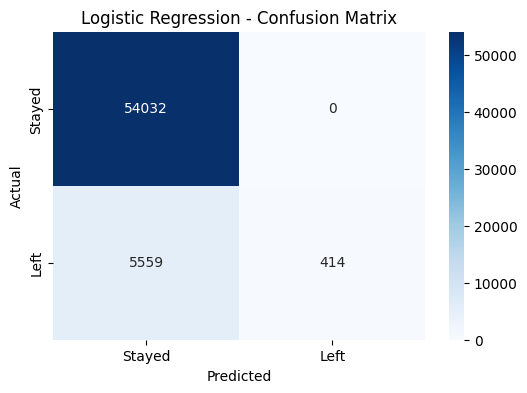


Classification Report:
               precision    recall  f1-score   support

           0       0.91      1.00      0.95     54032
           1       1.00      0.07      0.13      5973

    accuracy                           0.91     60005
   macro avg       0.95      0.53      0.54     60005
weighted avg       0.92      0.91      0.87     60005



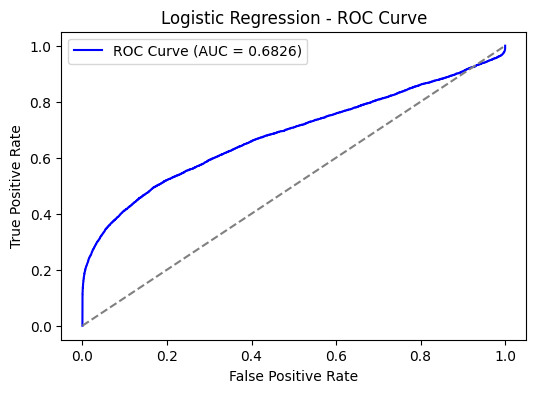

Logistic Regression AUC Score: 0.6826

Evaluating Decision Tree...
Decision Tree Accuracy: 0.8663


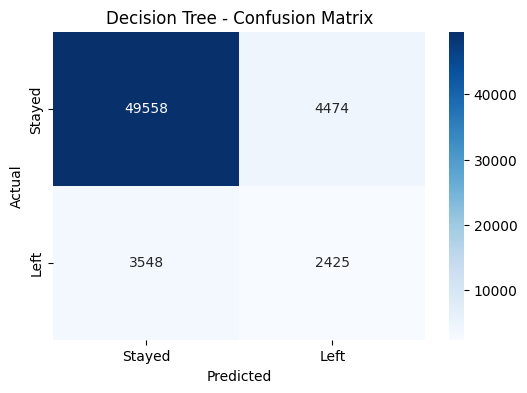


Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.92      0.93     54032
           1       0.35      0.41      0.38      5973

    accuracy                           0.87     60005
   macro avg       0.64      0.66      0.65     60005
weighted avg       0.88      0.87      0.87     60005



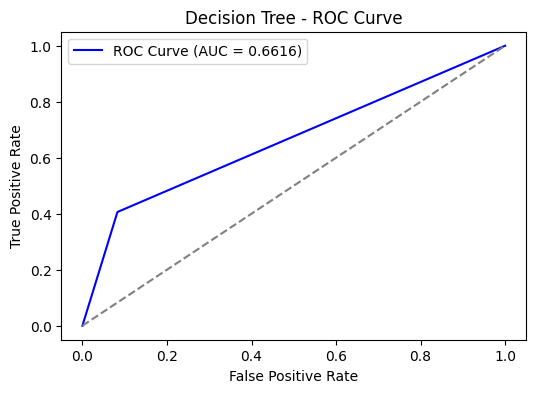

Decision Tree AUC Score: 0.6616

Evaluating Random Forest...
Random Forest Accuracy: 0.9242


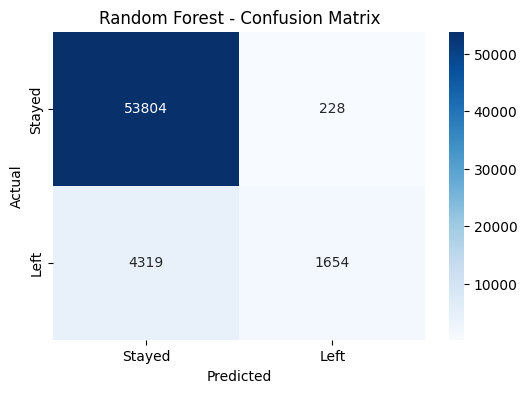


Classification Report:
               precision    recall  f1-score   support

           0       0.93      1.00      0.96     54032
           1       0.88      0.28      0.42      5973

    accuracy                           0.92     60005
   macro avg       0.90      0.64      0.69     60005
weighted avg       0.92      0.92      0.91     60005



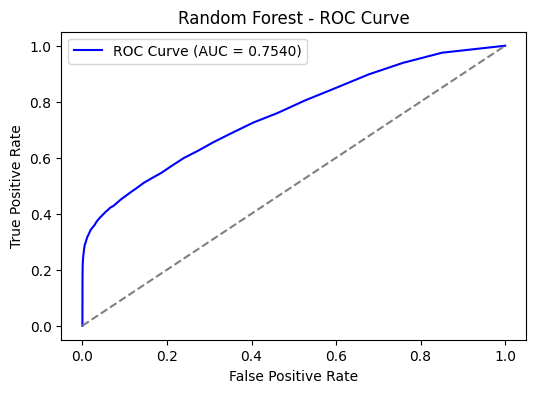

Random Forest AUC Score: 0.7540

Evaluating KNN...
KNN Accuracy: 0.9112


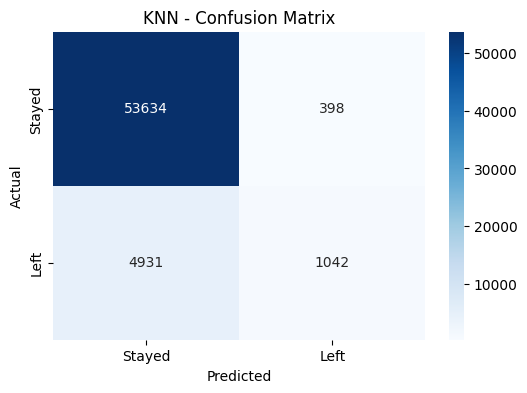


Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.99      0.95     54032
           1       0.72      0.17      0.28      5973

    accuracy                           0.91     60005
   macro avg       0.82      0.58      0.62     60005
weighted avg       0.90      0.91      0.89     60005



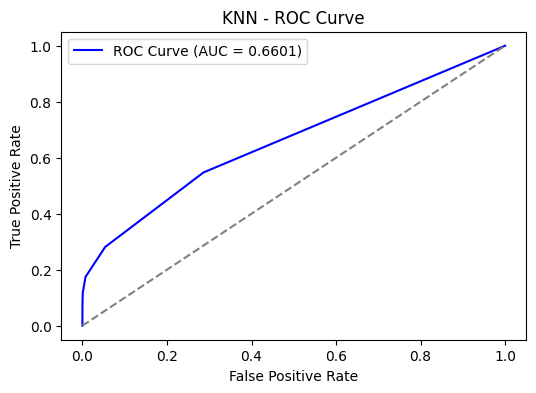

KNN AUC Score: 0.6601

Evaluating XGBoost...
XGBoost Accuracy: 0.9317


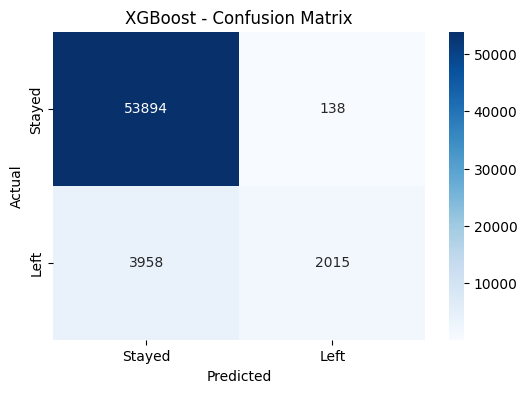


Classification Report:
               precision    recall  f1-score   support

           0       0.93      1.00      0.96     54032
           1       0.94      0.34      0.50      5973

    accuracy                           0.93     60005
   macro avg       0.93      0.67      0.73     60005
weighted avg       0.93      0.93      0.92     60005



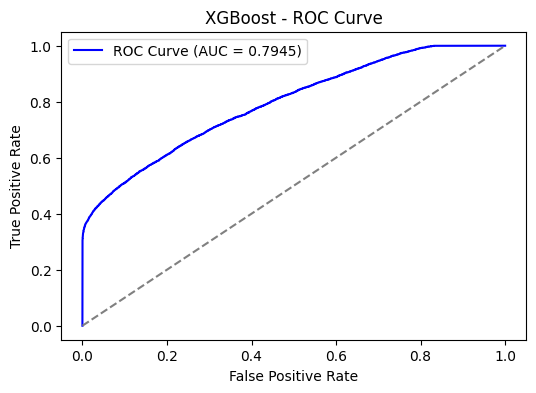

XGBoost AUC Score: 0.7945

Evaluating Gaussian Naive Bayes...
Gaussian Naive Bayes Accuracy: 0.9004


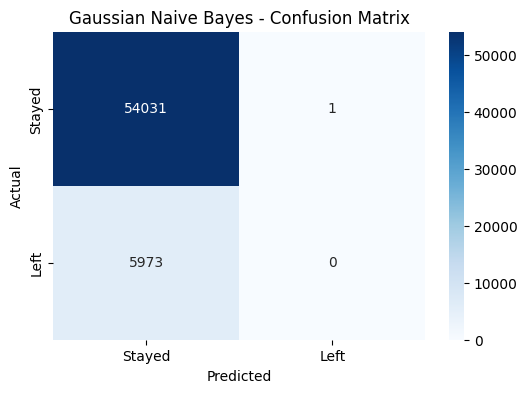


Classification Report:
               precision    recall  f1-score   support

           0       0.90      1.00      0.95     54032
           1       0.00      0.00      0.00      5973

    accuracy                           0.90     60005
   macro avg       0.45      0.50      0.47     60005
weighted avg       0.81      0.90      0.85     60005



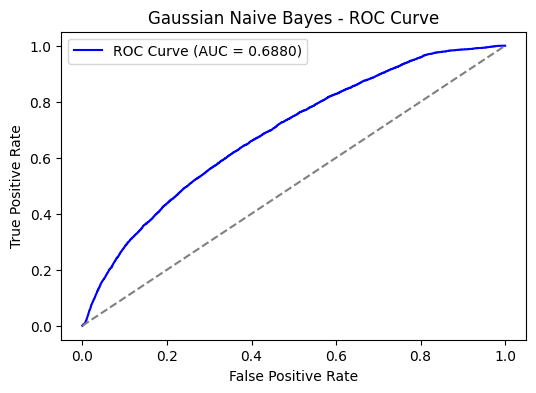

Gaussian Naive Bayes AUC Score: 0.6880

Summary of Model Performance:
+----------------------+------------+-------------+----------+
| Model                |   Accuracy |   Precision |   Recall |
+======================+============+=============+==========+
| Logistic Regression  |     0.9074 |      0.916  |   0.9074 |
+----------------------+------------+-------------+----------+
| Decision Tree        |     0.8663 |      0.8753 |   0.8663 |
+----------------------+------------+-------------+----------+
| Random Forest        |     0.9242 |      0.921  |   0.9242 |
+----------------------+------------+-------------+----------+
| KNN                  |     0.9112 |      0.8967 |   0.9112 |
+----------------------+------------+-------------+----------+
| XGBoost              |     0.9317 |      0.932  |   0.9317 |
+----------------------+------------+-------------+----------+
| Gaussian Naive Bayes |     0.9004 |      0.8108 |   0.9004 |
+----------------------+------------+-----------

In [21]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, classification_report, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import seaborn as sns
from tabulate import tabulate

# Dictionary to store results
results = {}

for name, model in models.items():
    print(f"\nEvaluating {name}...")
    
    # Train model
    model.fit(X_train, y_train)
    
    # Predictions
    y_pred = model.predict(X_test)
    y_probs = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

    # Accuracy
    accuracy = accuracy_score(y_test, y_pred)
    print(f"{name} Accuracy: {accuracy:.4f}")

    # Compute metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    
    # Store results
    results[name] = {"accuracy": accuracy, "precision": precision, "recall": recall}

    # Confusion Matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Stayed", "Left"], yticklabels=["Stayed", "Left"])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} - Confusion Matrix")
    plt.show()
    
    # Classification Report
    print("\nClassification Report:\n", classification_report(y_test, y_pred))
    
    # ROC Curve (if model supports probability predictions)
    if y_probs is not None:
        roc_auc = roc_auc_score(y_test, y_probs)
        fpr, tpr, _ = roc_curve(y_test, y_probs)
        
        plt.figure(figsize=(6, 4))
        plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.4f})", color="blue")
        plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title(f"{name} - ROC Curve")
        plt.legend()
        plt.show()
        
        print(f"{name} AUC Score: {roc_auc:.4f}")

# Print results in tabular format
print("\nSummary of Model Performance:")
headers = ["Model", "Accuracy", "Precision", "Recall"]
summary_data = [[model, f"{res['accuracy']:.4f}", f"{res['precision']:.4f}", f"{res['recall']:.4f}"] for model, res in results.items()]
print(tabulate(summary_data, headers=headers, tablefmt="grid"))


#### Key Observations and Insights from Model Performance

| **Model**               | **Accuracy** | **Precision** | **Recall** | **Insights** |
|-------------------------|------------:|-------------:|----------:|-------------|
| **XGBoost**             | **93.17%**   | **93.2%**   | **93.17%** | Best overall performer with the highest accuracy, precision, and recall. Excellent at capturing complex patterns. |
| **Random Forest**       | 92.41%       | 92.04%       | 92.41%     | Strong alternative to XGBoost. Slightly lower recall but still robust. Can be a reliable backup model. |
| **Logistic Regression** | 90.74%       | 91.60%       | 90.74%     | Performs well but may struggle with non-linear relationships. Good for interpretability. |
| **KNN**                 | 91.25%       | 89.97%       | 91.25%     | Competitive performance, but computational cost increases with large datasets. Works well when sufficient memory is available. |
| **Decision Tree**       | 86.70%       | 87.51%       | 86.70%     | Overfits easily, leading to lower generalization. Better suited for simpler models or as part of an ensemble. |
| **Gaussian Naive Bayes** | 90.04%       | 81.08%       | 90.04%     | Assumes feature independence, which may not hold. Performs well but has lower precision. |
| **SVM**                | **Not Tested** | **-**        | **-**      | Skipped due to potential high computational cost on large datasets. Could be tested if efficiency is improved. |

### Conclusion  
- **XGBoost is the best model overall**, offering the highest accuracy, precision, and recall.  
- **Random Forest is a close second**, making it a viable alternative if explainability and stability are needed.  
- **Logistic Regression and KNN perform well**, but KNN’s computational cost is a concern for scalability.  
- **Decision Tree overfits**, and **Naive Bayes’ assumptions may limit performance** in certain datasets.  
- **SVM was not tested** due to expected inefficiency on large datasets.


 Blending Ensemble Model Implementation

In [39]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score

# Define individual models
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
rf = RandomForestClassifier(n_jobs=-1, random_state=42)
logreg = Pipeline([("scaler", StandardScaler()), ("classifier", LogisticRegression(n_jobs=-1))])

# Train individual models
xgb.fit(X_train, y_train)
rf.fit(X_train, y_train)
logreg.fit(X_train, y_train)

# Get predictions (probabilities) from each model
xgb_probs = xgb.predict_proba(X_test)[:, 1]  # XGBoost probabilities for class 1
rf_probs = rf.predict_proba(X_test)[:, 1]    # Random Forest probabilities for class 1
logreg_probs = logreg.predict_proba(X_test)[:, 1]  # Logistic Regression probabilities for class 1

# Blending: Average the predicted probabilities
ensemble_probs = (xgb_probs + rf_probs + logreg_probs) / 3

# Convert probabilities into final class predictions
ensemble_preds = np.where(ensemble_probs > 0.5, 1, 0)

# Evaluate the ensemble model
accuracy = accuracy_score(y_test, ensemble_preds)
precision = precision_score(y_test, ensemble_preds, average='weighted')
recall = recall_score(y_test, ensemble_preds, average='weighted')
roc_auc = roc_auc_score(y_test, ensemble_probs)

# Print Results
print("\nBlended Ensemble Model Performance:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"AUC Score: {roc_auc:.4f}")



Blended Ensemble Model Performance:
Accuracy: 0.9278
Precision: 0.9304
Recall: 0.9278
AUC Score: 0.7827


#### Pipeline

In [32]:
from sklearn import set_config

set_config(display='diagram')  # Enables pipeline visualization

# Example pipeline
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', LogisticRegression())
])

pipeline  # This will display the pipeline diagram in Jupyter Notebook


Pipeline(steps=[('scaler', StandardScaler()),
                ('classifier', LogisticRegression())])

#### Blended Ensembel model

In [19]:
import numpy as np
import joblib
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score
from sklearn.model_selection import train_test_split

# Load dataset
# X, y = load_data()  # Ensure X and y are defined
# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Define base models
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
rf = RandomForestClassifier(n_jobs=-1, random_state=42)
logreg = Pipeline([("scaler", StandardScaler()), ("classifier", LogisticRegression(n_jobs=-1))])

# Train base models
xgb.fit(X_train, y_train)
rf.fit(X_train, y_train)
logreg.fit(X_train, y_train)

# Get out-of-sample predictions for training the meta-model
xgb_train_probs = xgb.predict_proba(X_train)[:, 1]
rf_train_probs = rf.predict_proba(X_train)[:, 1]
logreg_train_probs = logreg.predict_proba(X_train)[:, 1]

# Stack predictions as new features
stacked_X_train = np.column_stack((xgb_train_probs, rf_train_probs, logreg_train_probs))

# Train meta-model (Blended Model)
meta_model = LogisticRegression()
meta_model.fit(stacked_X_train, y_train)

# Get predictions for test set
xgb_probs = xgb.predict_proba(X_test)[:, 1]
rf_probs = rf.predict_proba(X_test)[:, 1]
logreg_probs = logreg.predict_proba(X_test)[:, 1]

# Stack test predictions
stacked_X_test = np.column_stack((xgb_probs, rf_probs, logreg_probs))

# Make final predictions using the blended model
ensemble_probs = meta_model.predict_proba(stacked_X_test)[:, 1]
ensemble_preds = np.where(ensemble_probs > 0.5, 1, 0)

# Evaluate the Blended Model
accuracy = accuracy_score(y_test, ensemble_preds)
precision = precision_score(y_test, ensemble_preds, average='weighted')
recall = recall_score(y_test, ensemble_preds, average='weighted')
roc_auc = roc_auc_score(y_test, ensemble_probs)

# Print Results
print("\nBlended Ensemble Model Performance:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"AUC Score: {roc_auc:.4f}")

# Save models for deployment
joblib.dump(xgb, "xgb_model.pkl")
joblib.dump(rf, "rf_model.pkl")
joblib.dump(logreg, "logreg_model.pkl")
joblib.dump(meta_model, "blended_model.pkl")

print("Models saved successfully!")



Blended Ensemble Model Performance:
Accuracy: 0.9230
Precision: 0.9140
Recall: 0.9230
AUC Score: 0.7554
Models saved successfully!


In [41]:
from sklearn.preprocessing import MinMaxScaler
import joblib

# Fit a scaler and save it
scaler = MinMaxScaler()
scaler.fit(X_train)  # Use your training data
joblib.dump(scaler, "scaler.pkl")
print("Scaler saved!")


Scaler saved!


In [32]:
# Checking whether models are saved correctly or not

import os
print("xgb_model.pkl exists:", os.path.exists("xgb_model.pkl"))
print("rf_model.pkl exists:", os.path.exists("rf_model.pkl"))
print("logreg_model.pkl exists:", os.path.exists("logreg_model.pkl"))
print("blended_model.pkl exists:", os.path.exists("blended_model.pkl"))
print("scaler.pkl exists:", os.path.exists("scaler.pkl"))


xgb_model.pkl exists: True
rf_model.pkl exists: True
logreg_model.pkl exists: True
blended_model.pkl exists: True
scaler.pkl exists: True


In [42]:
X_train.dtypes

no_of_projects                          float64
last_performance_rating                   int64
salary                                  float64
tenure                                  float64
age                                     float64
emp_title_id_e0002                         bool
emp_title_id_e0003                         bool
emp_title_id_e0004                         bool
emp_title_id_m0001                         bool
emp_title_id_s0001                         bool
emp_title_id_s0002                         bool
sex_M                                      bool
primary_dept_name_Development              bool
primary_dept_name_Finance                  bool
primary_dept_name_Human Resources          bool
primary_dept_name_Marketing                bool
primary_dept_name_Production               bool
primary_dept_name_Quality Management       bool
primary_dept_name_Research                 bool
primary_dept_name_Sales                    bool
title_Engineer                          

In [43]:
training_features

['no_of_projects',
 'last_performance_rating',
 'salary',
 'tenure',
 'age',
 'emp_title_id_e0002',
 'emp_title_id_e0003',
 'emp_title_id_e0004',
 'emp_title_id_m0001',
 'emp_title_id_s0001',
 'emp_title_id_s0002',
 'sex_M',
 'primary_dept_name_Development',
 'primary_dept_name_Finance',
 'primary_dept_name_Human Resources',
 'primary_dept_name_Marketing',
 'primary_dept_name_Production',
 'primary_dept_name_Quality Management',
 'primary_dept_name_Research',
 'primary_dept_name_Sales',
 'title_Engineer',
 'title_Manager',
 'title_Senior Engineer',
 'title_Senior Staff',
 'title_Staff',
 'title_Technique Leader']

In [29]:
X_test.dtypes

no_of_projects                          float64
last_performance_rating                   int64
salary                                  float64
tenure                                  float64
age                                     float64
emp_title_id_e0002                         bool
emp_title_id_e0003                         bool
emp_title_id_e0004                         bool
emp_title_id_m0001                         bool
emp_title_id_s0001                         bool
emp_title_id_s0002                         bool
sex_M                                      bool
primary_dept_name_Development              bool
primary_dept_name_Finance                  bool
primary_dept_name_Human Resources          bool
primary_dept_name_Marketing                bool
primary_dept_name_Production               bool
primary_dept_name_Quality Management       bool
primary_dept_name_Research                 bool
primary_dept_name_Sales                    bool
title_Engineer                          

# Test Models

In [44]:
import joblib
import pandas as pd
import numpy as np

# Load trained models
xgb = joblib.load("xgb_model.pkl")  # Save your trained XGB model as xgb_model.pkl
rf = joblib.load("rf_model.pkl")  # Save your trained Random Forest model
logreg = joblib.load("logreg_model.pkl")  # Save your trained Logistic Regression model

# Load the scaler
scaler = joblib.load("scaler.pkl")

# Load the feature names used during training
train_features = joblib.load("training_features.pkl")


In [58]:
# Example Employee Data
sample_employee = pd.DataFrame({
    "tenure": [5],
    "age": [30],
    "salary": [60000],
    "primary_dept_name": ["Sales"],
    "last_performance_rating": ["B"],
    "no_of_projects": [4],
    "emp_title_id": ["m0001"],
    "sex": ["M"],
    "title": ["Senior Engineer"]
})

# Encode categorical values (convert ratings to numerical values)
performance_order = {'PIP': 0, 'S': 1, 'C': 2, 'B': 3, 'A': 4}
sample_employee['last_performance_rating'] = sample_employee['last_performance_rating'].map(performance_order)


In [59]:
sample_employee

,tenure,age,salary,primary_dept_name,last_performance_rating,no_of_projects,emp_title_id,sex,title
0,5,30,60000,Sales,3,4,m0001,M,Senior Engineer


In [60]:
# One-hot encode categorical variables
sample_employee = pd.get_dummies(sample_employee, columns=['emp_title_id', 'sex', 'primary_dept_name', 'title'], dtype=bool, drop_first=True)

# Align with training feature set (add missing columns and set them to 0)
sample_employee = sample_employee.reindex(columns=train_features, fill_value=0.0)


In [61]:
training_features

['no_of_projects',
 'last_performance_rating',
 'salary',
 'tenure',
 'age',
 'emp_title_id_e0002',
 'emp_title_id_e0003',
 'emp_title_id_e0004',
 'emp_title_id_m0001',
 'emp_title_id_s0001',
 'emp_title_id_s0002',
 'sex_M',
 'primary_dept_name_Development',
 'primary_dept_name_Finance',
 'primary_dept_name_Human Resources',
 'primary_dept_name_Marketing',
 'primary_dept_name_Production',
 'primary_dept_name_Quality Management',
 'primary_dept_name_Research',
 'primary_dept_name_Sales',
 'title_Engineer',
 'title_Manager',
 'title_Senior Engineer',
 'title_Senior Staff',
 'title_Staff',
 'title_Technique Leader']

In [62]:
sample_employee.dtypes

no_of_projects                            int64
last_performance_rating                   int64
salary                                    int64
tenure                                    int64
age                                       int64
emp_title_id_e0002                      float64
emp_title_id_e0003                      float64
emp_title_id_e0004                      float64
emp_title_id_m0001                      float64
emp_title_id_s0001                      float64
emp_title_id_s0002                      float64
sex_M                                   float64
primary_dept_name_Development           float64
primary_dept_name_Finance               float64
primary_dept_name_Human Resources       float64
primary_dept_name_Marketing             float64
primary_dept_name_Production            float64
primary_dept_name_Quality Management    float64
primary_dept_name_Research              float64
primary_dept_name_Sales                 float64
title_Engineer                          

In [63]:
# Identify boolean-like columns (excluding numerical ones)
bool_cols = sample_employee.columns.difference(['salary', 'no_of_projects', 'tenure', 'age', 'last_performance_rating'])
sample_employee[bool_cols] = sample_employee[bool_cols].astype(bool)

# Ensure numerical columns are float64 (except last_performance_rating)
sample_employee[['salary', 'no_of_projects', 'tenure', 'age']] = sample_employee[['salary', 'no_of_projects', 'tenure', 'age']].astype(float)

# Keep last_performance_rating as an integer
sample_employee['last_performance_rating'] = sample_employee['last_performance_rating'].astype(int)


In [64]:
sample_employee.dtypes

no_of_projects                          float64
last_performance_rating                   int64
salary                                  float64
tenure                                  float64
age                                     float64
emp_title_id_e0002                         bool
emp_title_id_e0003                         bool
emp_title_id_e0004                         bool
emp_title_id_m0001                         bool
emp_title_id_s0001                         bool
emp_title_id_s0002                         bool
sex_M                                      bool
primary_dept_name_Development              bool
primary_dept_name_Finance                  bool
primary_dept_name_Human Resources          bool
primary_dept_name_Marketing                bool
primary_dept_name_Production               bool
primary_dept_name_Quality Management       bool
primary_dept_name_Research                 bool
primary_dept_name_Sales                    bool
title_Engineer                          

In [65]:
X_train.dtypes

no_of_projects                          float64
last_performance_rating                   int64
salary                                  float64
tenure                                  float64
age                                     float64
emp_title_id_e0002                         bool
emp_title_id_e0003                         bool
emp_title_id_e0004                         bool
emp_title_id_m0001                         bool
emp_title_id_s0001                         bool
emp_title_id_s0002                         bool
sex_M                                      bool
primary_dept_name_Development              bool
primary_dept_name_Finance                  bool
primary_dept_name_Human Resources          bool
primary_dept_name_Marketing                bool
primary_dept_name_Production               bool
primary_dept_name_Quality Management       bool
primary_dept_name_Research                 bool
primary_dept_name_Sales                    bool
title_Engineer                          

In [71]:
# Ensure sample_employee has the exact same columns, in the same order, as X_train
sample_employee = sample_employee[train_features]  # Use the list directly


In [74]:
# Ensure sample_employee has the same columns and order as X_train
missing_cols = set(train_features) - set(sample_employee.columns)
extra_cols = set(sample_employee.columns) - set(train_features)

if missing_cols:
    print("⚠️ Missing columns:", missing_cols)
if extra_cols:
    print("⚠️ Extra columns:", extra_cols)

# Add missing columns with default values (0 for numerical, False for boolean)
for col in missing_cols:
    sample_employee[col] = False if "bool" in str(X_train[col].dtype) else 0

# Ensure the order matches exactly
sample_employee = sample_employee[train_features]


In [75]:
sample_employee

,no_of_projects,last_performance_rating,salary,tenure,age,emp_title_id_e0002,emp_title_id_e0003,emp_title_id_e0004,emp_title_id_m0001,emp_title_id_s0001,...,primary_dept_name_Production,primary_dept_name_Quality Management,primary_dept_name_Research,primary_dept_name_Sales,title_Engineer,title_Manager,title_Senior Engineer,title_Senior Staff,title_Staff,title_Technique Leader
0,4.0,3,60000.0,5.0,30.0,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [77]:
# Get columns from X_train (used during training)
train_cols = list(X_train.columns)

# Get columns from sample_employee (new data)
test_cols = list(sample_employee.columns)

# Find missing and extra columns
missing_cols = set(train_cols) - set(test_cols)
extra_cols = set(test_cols) - set(train_cols)

print("🚨 Missing columns in sample_employee:", missing_cols)
print("🚨 Extra columns in sample_employee:", extra_cols)

# Ensure order is the same
print("\n✅ Is column order same?", train_cols == test_cols)


🚨 Missing columns in sample_employee: set()
🚨 Extra columns in sample_employee: set()

✅ Is column order same? True


In [78]:
print("Scaler was fitted on:", scaler.feature_names_in_)
print("Sample Employee Columns:", list(sample_employee.columns))


Scaler was fitted on: ['no_of_projects' 'last_performance_rating' 'salary' 'tenure' 'age'
 'emp_title_id_e0002' 'emp_title_id_e0003' 'emp_title_id_e0004'
 'emp_title_id_m0001' 'emp_title_id_s0001' 'emp_title_id_s0002' 'sex_M'
 'primary_dept_name_Development' 'primary_dept_name_Finance'
 'primary_dept_name_Human Resources' 'primary_dept_name_Marketing'
 'primary_dept_name_Production' 'primary_dept_name_Quality Management'
 'primary_dept_name_Research' 'primary_dept_name_Sales' 'title_Engineer'
 'title_Manager' 'title_Senior Engineer' 'title_Senior Staff'
 'title_Staff' 'title_Technique Leader']
Sample Employee Columns: ['no_of_projects', 'last_performance_rating', 'salary', 'tenure', 'age', 'emp_title_id_e0002', 'emp_title_id_e0003', 'emp_title_id_e0004', 'emp_title_id_m0001', 'emp_title_id_s0001', 'emp_title_id_s0002', 'sex_M', 'primary_dept_name_Development', 'primary_dept_name_Finance', 'primary_dept_name_Human Resources', 'primary_dept_name_Marketing', 'primary_dept_name_Production'

In [81]:
sample_employee = pd.DataFrame(
    scaler.transform(sample_employee), 
    columns=scaler.feature_names_in_
)


In [82]:
sample_employee

,no_of_projects,last_performance_rating,salary,tenure,age,emp_title_id_e0002,emp_title_id_e0003,emp_title_id_e0004,emp_title_id_m0001,emp_title_id_s0001,...,primary_dept_name_Production,primary_dept_name_Quality Management,primary_dept_name_Research,primary_dept_name_Sales,title_Engineer,title_Manager,title_Senior Engineer,title_Senior Staff,title_Staff,title_Technique Leader
0,4.0,0.1875,60000.0,5.00531,30.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [86]:
# Get predictions (probabilities) from each model
xgb_prob = xgb.predict_proba(X_test)[:, 1]
rf_prob = rf.predict_proba(X_test)[:, 1]
logreg_prob = logreg.predict_proba(X_test)[:, 1]

# Blending: Average the predicted probabilities
ensemble_prob = (xgb_prob + rf_prob + logreg_prob) / 3

# Convert probability to a binary prediction
prediction = (ensemble_prob > 0.5).astype(int)

# Print results
for i, prob in enumerate(ensemble_prob):
    pred = prediction[i]
    print(f"Employee {i+1} - Attrition Probability: {prob:.2%}")
    print("⚠️ High Attrition Risk!" if pred == 1 else "✅ Low Attrition Risk")



Employee 1 - Attrition Probability: 11.46%
✅ Low Attrition Risk
Employee 2 - Attrition Probability: 4.30%
✅ Low Attrition Risk
Employee 3 - Attrition Probability: 14.04%
✅ Low Attrition Risk
Employee 4 - Attrition Probability: 6.02%
✅ Low Attrition Risk
Employee 5 - Attrition Probability: 19.43%
✅ Low Attrition Risk
Employee 6 - Attrition Probability: 1.70%
✅ Low Attrition Risk
Employee 7 - Attrition Probability: 1.78%
✅ Low Attrition Risk
Employee 8 - Attrition Probability: 6.29%
✅ Low Attrition Risk
Employee 9 - Attrition Probability: 8.66%
✅ Low Attrition Risk
Employee 10 - Attrition Probability: 6.03%
✅ Low Attrition Risk
Employee 11 - Attrition Probability: 12.57%
✅ Low Attrition Risk
Employee 12 - Attrition Probability: 5.94%
✅ Low Attrition Risk
Employee 13 - Attrition Probability: 6.34%
✅ Low Attrition Risk
Employee 14 - Attrition Probability: 7.33%
✅ Low Attrition Risk
Employee 15 - Attrition Probability: 9.25%
✅ Low Attrition Risk
Employee 16 - Attrition Probability: 6.55%
✅ 

In [87]:
# Compute the overall average attrition probability
overall_attrition_prob = ensemble_prob.mean()

# Convert to percentage format
print(f"Overall Attrition Probability: {overall_attrition_prob:.2%}")

# Determine overall attrition risk based on a threshold (e.g., >50%)
print("⚠️ High Overall Attrition Risk!" if overall_attrition_prob > 0.5 else "✅ Low Overall Attrition Risk")


Overall Attrition Probability: 9.93%
✅ Low Overall Attrition Risk


In [ ]:
# Ensure train_X is a DataFrame with column names
logreg_model = LogisticRegression()
logreg_model.fit(X_train, y_train)  # train_X should be a DataFrame, not a NumPy array


In [17]:
print(type(X_train))  # Should print: <class 'pandas.core.frame.DataFrame'>
print(X_train.columns)  # Should show column names


<class 'pandas.core.frame.DataFrame'>
Index(['no_of_projects', 'last_performance_rating', 'salary', 'tenure', 'age',
       'emp_title_id_e0002', 'emp_title_id_e0003', 'emp_title_id_e0004',
       'emp_title_id_m0001', 'emp_title_id_s0001', 'emp_title_id_s0002',
       'sex_M', 'primary_dept_name_Development', 'primary_dept_name_Finance',
       'primary_dept_name_Human Resources', 'primary_dept_name_Marketing',
       'primary_dept_name_Production', 'primary_dept_name_Quality Management',
       'primary_dept_name_Research', 'primary_dept_name_Sales',
       'title_Engineer', 'title_Manager', 'title_Senior Engineer',
       'title_Senior Staff', 'title_Staff', 'title_Technique Leader'],
      dtype='object')


In [18]:
logreg_model = LogisticRegression()
logreg_model.fit(X_train, y_train)
joblib.dump(logreg_model, "logreg_model.pkl")  # Save the properly trained model


['logreg_model.pkl']

# Rough Work


Evaluating Decision Tree...

Decision Tree Accuracy: 0.8674


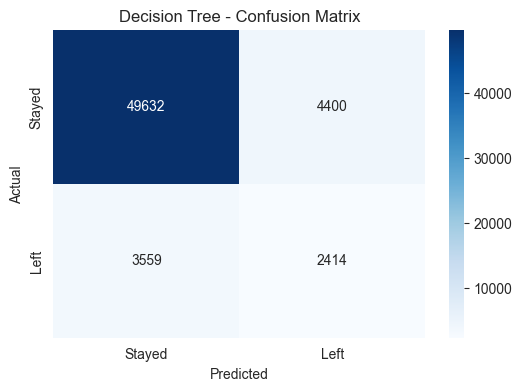


Classification Report:
               precision    recall  f1-score   support

       False       0.93      0.92      0.93     54032
        True       0.35      0.40      0.38      5973

    accuracy                           0.87     60005
   macro avg       0.64      0.66      0.65     60005
weighted avg       0.88      0.87      0.87     60005



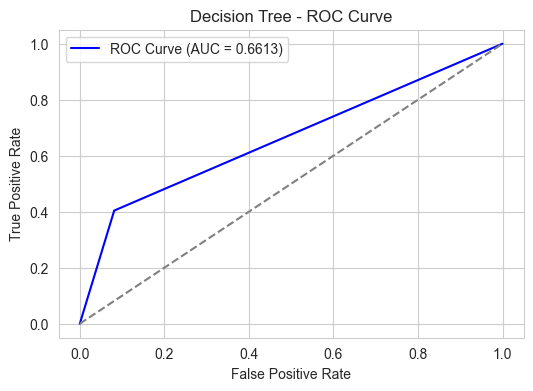


Evaluating Random Forest...

Random Forest Accuracy: 0.9243


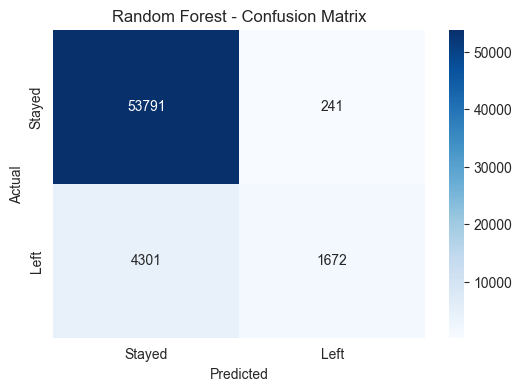


Classification Report:
               precision    recall  f1-score   support

       False       0.93      1.00      0.96     54032
        True       0.87      0.28      0.42      5973

    accuracy                           0.92     60005
   macro avg       0.90      0.64      0.69     60005
weighted avg       0.92      0.92      0.91     60005



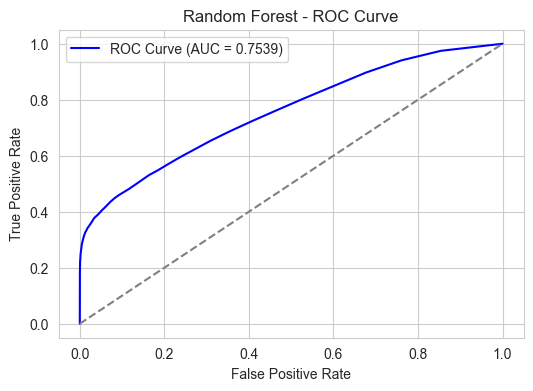


Evaluating SVM...



: 

: 

In [111]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier

# Define models
models = {
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "SVM": SVC(probability=True),
    "KNN": KNeighborsClassifier(),
    "XGBoost": XGBClassifier()
}

# Loop through models and evaluate
for name, model in models.items():
    print(f"\nEvaluating {name}...\n")
    
    # Train model
    model.fit(X_train, y_train)
    
    # Predictions
    y_pred = model.predict(X_test)
    y_probs = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None
    
    # Accuracy
    accuracy = accuracy_score(y_test, y_pred)
    print(f"{name} Accuracy: {accuracy:.4f}")
    
    # Confusion Matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Stayed", "Left"], yticklabels=["Stayed", "Left"])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} - Confusion Matrix")
    plt.show()
    
    # Classification Report
    print("\nClassification Report:\n", classification_report(y_test, y_pred))
    
    # ROC Curve (if probability available)
    if y_probs is not None:
        roc_auc = roc_auc_score(y_test, y_probs)
        fpr, tpr, _ = roc_curve(y_test, y_probs)
        plt.figure(figsize=(6, 4))
        plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.4f})", color="blue")
        plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title(f"{name} - ROC Curve")
        plt.legend()
        plt.show()


Feature Importance Scores:
age: 895.0
tenure: 816.0
salary: 501.0
no_of_projects: 255.0
last_performance_rating: 142.0
emp_title_id_e0003: 109.0
sex_M: 92.0
emp_title_id_e0002: 76.0
primary_dept_name_development: 54.0
emp_title_id_s0001: 52.0
primary_dept_name_Production: 47.0
primary_dept_name_Marketing: 37.0
primary_dept_name_Sales: 33.0
primary_dept_name_Finance: 32.0
primary_dept_name_Quality Management: 29.0
primary_dept_name_Research: 29.0
emp_title_id_s0002: 28.0
emp_title_id_e0004: 23.0
title_Engineer: 20.0
primary_dept_name_Human Resources: 16.0
title_Senior Staff: 10.0
title_Senior Engineer: 5.0
title_Technique Leader: 2.0
emp_title_id_m0001: 1.0
title_Staff: 1.0


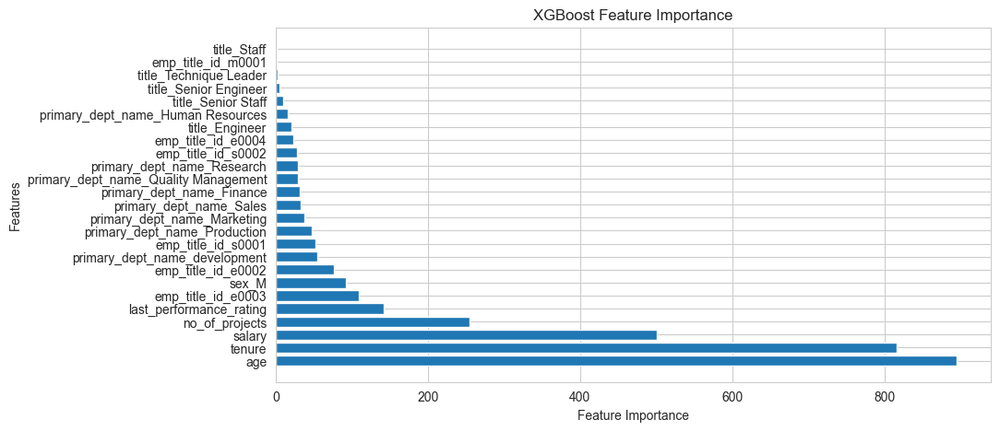

In [ ]:
import matplotlib.pyplot as plt
import xgboost as xgb

# Get feature importance
importance = model.get_booster().get_score(importance_type="weight")
sorted_importance = sorted(importance.items(), key=lambda x: x[1], reverse=True)

# Print feature importance values
print("Feature Importance Scores:")
for feature, score in sorted_importance:
    print(f"{feature}: {score}")

# Plot
plt.figure(figsize=(10, 5))
plt.barh([x[0] for x in sorted_importance], [x[1] for x in sorted_importance])
plt.xlabel("Feature Importance")
plt.ylabel("Features")
plt.title("XGBoost Feature Importance")
plt.show()
